# Assessment of the hypothesis made for the density estimation 

The goal of this notebook is to verify if the issue occuring in the density estimation would disappear when the hypothesis is verified i.e. artefacts are less frequent than tiles with tissue. 
To do so, I will concatenate different images with the same kind of artefacts and with different types of artefacts and redo the same process 

Unfortunately, the center 'FK' seems to always use a green marker thus the examples come from this FK center.

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

import pandas as pd
import umap.umap_ as umap
import pacmap

from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from matplotlib.offsetbox import OffsetImage, AnnotationBbox
from scipy.stats import gaussian_kde
from sklearn.decomposition import PCA
from sklearn.neighbors import NearestNeighbors
from sklearn.manifold import Isomap, LocallyLinearEmbedding, SpectralEmbedding, TSNE

2022-03-21 10:40:02.342952: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcudart.so.11.0'; dlerror: libcudart.so.11.0: cannot open shared object file: No such file or directory; LD_LIBRARY_PATH: /.singularity.d/libs
2022-03-21 10:40:02.343013: I tensorflow/stream_executor/cuda/cudart_stub.cc:29] Ignore above cudart dlerror if you do not have a GPU set up on your machine.


# Building datasets

In [2]:
lat = pd.read_feather('/mnt/iribhm/people/zzhang/code/TCGA_cluster/data/combined_latent_space_fullpath.feather')
lat.head()

,tile,svs,0,1,2,3,4,5,6,7,...,502,503,504,505,506,507,508,509,510,511
0,/mnt/scratch/TCGA-all/THCA/output/tiles/40X/0....,TCGA-QD-A8IV-01Z-00-DX1.9E2B5E8D-07AA-4537-80D...,1.339570,1.569288,1.397411,0.032332,1.402293,0.959583,3.486725,0.355358,...,0.528338,1.788311,0.410754,1.664308,0.789737,1.150083,0.803699,1.044336,0.652768,0.722132
1,/mnt/scratch/TCGA-all/THCA/output/tiles/40X/0....,TCGA-QD-A8IV-01Z-00-DX1.9E2B5E8D-07AA-4537-80D...,1.228593,1.210114,0.727935,0.280875,1.861950,0.448392,2.681626,1.157279,...,0.438211,0.931869,0.155734,0.823909,0.377280,0.676033,1.010682,0.514849,0.921608,0.199555
2,/mnt/scratch/TCGA-all/THCA/output/tiles/40X/0....,TCGA-QD-A8IV-01Z-00-DX1.9E2B5E8D-07AA-4537-80D...,1.048387,1.257178,0.211658,0.878425,1.004081,0.064842,0.381254,0.977834,...,0.215929,0.384132,0.304639,0.254615,0.329003,0.511925,0.681532,0.296242,1.518245,0.058722
3,/mnt/scratch/TCGA-all/THCA/output/tiles/40X/0....,TCGA-QD-A8IV-01Z-00-DX1.9E2B5E8D-07AA-4537-80D...,1.196052,1.084651,0.368335,1.184882,1.054535,0.079134,0.320792,1.018065,...,0.172824,0.463582,0.489265,0.535492,0.603775,0.645780,0.575607,0.442357,1.314678,0.078109
4,/mnt/scratch/TCGA-all/THCA/output/tiles/40X/0....,TCGA-QD-A8IV-01Z-00-DX1.9E2B5E8D-07AA-4537-80D...,0.861108,1.000635,0.288257,0.978721,0.839581,0.074189,0.270683,0.873256,...,0.234085,0.517751,0.275200,0.334048,0.320824,0.247260,0.664842,0.612858,1.236189,0.067835


In [6]:
sub = pd.DataFrame()
sub["center"] = lat["svs"].str[5:7].unique()

In [7]:
sub

,center
0,QD
1,EM
2,FY
3,EL
4,DO
5,BJ
6,ET
7,J8
8,DJ
9,FE


In [17]:
test = lat.loc[lat['svs'].str.startswith('TCGA-H2')]
test['svs'].unique()

array(['TCGA-H2-A3RH-01Z-00-DX1.444D8191-ADFF-4A59-BC33-B08F246594AE.svs',
       'TCGA-H2-A3RI-01Z-00-DX1.AD845C14-4A49-4322-8AA4-6BD565CDFD90.svs',
       'TCGA-H2-A422-01Z-00-DX1.C3720576-E593-4FFB-A648-942B61FEDDD1.svs',
       'TCGA-H2-A2K9-01Z-00-DX1.4FA56AC1-CC13-43B4-A8D8-06EDC96D0968.svs',
       'TCGA-H2-A421-01Z-00-DX1.1D6462C1-2B95-4BC4-A563-45CFE5C0C17E.svs'],
      dtype=object)

In [18]:
selected = ["TCGA-QD-A8IV-01Z-00-DX1.9E2B5E8D-07AA-4537-80D7-D81D448FBF3F.svs", "TCGA-EM-A2CJ-01Z-00-DX1.D6F4716C-D6C7-4087-9B17-E1D89A3EEA8F.svs",
            "TCGA-FY-A76V-01Z-00-DX1.A7793C02-5EFE-4125-897E-ADAD1A6AF039.svs", "TCGA-4C-A93U-01Z-00-DX2.15B0C115-43F2-415E-AB24-315635E655AA.svs", 
            "TCGA-DO-A2HM-01Z-00-DX1.20D6ED5E-AD06-464B-9311-8D470E236931.svs", "TCGA-FK-A3S3-01Z-00-DX1.27050211-E584-4001-B256-AC113B08FAA0.svs",
            "TCGA-E8-A415-01Z-00-DX1.99DCF277-DF60-456C-AD70-003C08D9FA01.svs", "TCGA-IM-A3U2-01Z-00-DX1.CECE491E-95AF-4D3A-8579-358280639B0B.svs",
            "TCGA-H2-A422-01Z-00-DX1.C3720576-E593-4FFB-A648-942B61FEDDD1.svs"]

In [19]:
l = []
for i in range(len(selected)):
    df = lat.loc[lat['svs']==selected[i]]
    l.append(df)
df = pd.concat(l)
#df.head()
print(df.shape)

(505942, 514)


In [21]:
df = df.drop(columns=['svs'])
df.head()

,tile,0,1,2,3,4,5,6,7,8,...,502,503,504,505,506,507,508,509,510,511
0,/mnt/scratch/TCGA-all/THCA/output/tiles/40X/0....,1.339570,1.569288,1.397411,0.032332,1.402293,0.959583,3.486725,0.355358,0.851296,...,0.528338,1.788311,0.410754,1.664308,0.789737,1.150083,0.803699,1.044336,0.652768,0.722132
1,/mnt/scratch/TCGA-all/THCA/output/tiles/40X/0....,1.228593,1.210114,0.727935,0.280875,1.861950,0.448392,2.681626,1.157279,0.309872,...,0.438211,0.931869,0.155734,0.823909,0.377280,0.676033,1.010682,0.514849,0.921608,0.199555
2,/mnt/scratch/TCGA-all/THCA/output/tiles/40X/0....,1.048387,1.257178,0.211658,0.878425,1.004081,0.064842,0.381254,0.977834,0.160476,...,0.215929,0.384132,0.304639,0.254615,0.329003,0.511925,0.681532,0.296242,1.518245,0.058722
3,/mnt/scratch/TCGA-all/THCA/output/tiles/40X/0....,1.196052,1.084651,0.368335,1.184882,1.054535,0.079134,0.320792,1.018065,0.107962,...,0.172824,0.463582,0.489265,0.535492,0.603775,0.645780,0.575607,0.442357,1.314678,0.078109
4,/mnt/scratch/TCGA-all/THCA/output/tiles/40X/0....,0.861108,1.000635,0.288257,0.978721,0.839581,0.074189,0.270683,0.873256,0.111318,...,0.234085,0.517751,0.275200,0.334048,0.320824,0.247260,0.664842,0.612858,1.236189,0.067835


In [23]:
lat.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 34686138 entries, 0 to 34686137
Columns: 514 entries, tile to 511
dtypes: float64(512), object(2)
memory usage: 132.8+ GB


In [24]:
df = lat.sample(n=505942)
df = df.drop(columns=['svs'])
df.head()

,tile,0,1,2,3,4,5,6,7,8,...,502,503,504,505,506,507,508,509,510,511
5697431,/mnt/scratch/TCGA-all/THCA/output/tiles/40X/0....,1.004834,0.822596,0.094034,1.143904,0.649786,0.303841,0.091374,0.180996,1.432351,...,0.699191,0.946472,1.093924,0.518414,1.379403,1.642720,0.761212,0.573444,0.407963,0.066643
1253777,/mnt/scratch/TCGA-all/THCA/output/tiles/40X/0....,0.059855,1.366125,0.736085,0.195295,0.581653,0.745851,0.663828,1.083930,1.274521,...,1.357252,0.527398,0.856255,1.231662,1.292580,0.474360,0.215383,1.264265,0.762791,0.287935
28185089,/mnt/scratch/TCGA-all/THCA/output/tiles/40X/0....,1.466943,0.957807,0.947728,0.891744,0.842631,0.522288,0.823905,0.778780,0.695599,...,0.917612,0.391558,0.316002,0.782346,0.768788,1.188846,0.493188,0.311505,1.906640,0.925281
25154606,/mnt/scratch/TCGA-all/THCA/output/tiles/40X/0....,1.404358,1.766694,0.155782,1.240733,1.377370,0.324171,0.425137,0.870583,1.544604,...,0.745595,0.362451,1.025376,0.528000,1.619116,0.731081,0.504440,0.891933,1.947080,0.226709
21997697,/mnt/scratch/TCGA-all/THCA/output/tiles/40X/0....,1.716579,0.417727,0.077488,2.214312,0.112965,0.018634,0.527126,0.081741,0.328163,...,0.138226,0.545368,1.899977,0.273593,2.974507,0.924999,0.151481,0.331205,0.336211,0.867459


In [26]:
df.to_csv('data/cigalat_mixed_WSI_random.csv', index=False)

In [ ]:
df = pd.read_csv("data/cigalat_mixed_WSI_random.csv", index_col='tile')
df.head()

In [2]:
lat = pd.read_feather('/mnt/iribhm/people/zzhang/code/TCGA_cluster/resmlp_12_224/combined_latent_space_fullpath_iribhm.feather')
lat.head()

,tile,svs,0,1,2,3,4,5,6,7,...,374,375,376,377,378,379,380,381,382,383
0,/mnt/iribhm/TCGA-all/THCA/output/tiles/40X/0.2...,TCGA-QD-A8IV-01Z-00-DX1.9E2B5E8D-07AA-4537-80D...,-1.707656,0.587706,-0.180280,1.867831,3.523753,-4.002672,-1.946798,0.643802,...,-0.674413,-5.434752,-0.749451,0.692665,-0.606865,4.626988,-0.308424,1.315997,-3.207755,-1.797205
1,/mnt/iribhm/TCGA-all/THCA/output/tiles/40X/0.2...,TCGA-QD-A8IV-01Z-00-DX1.9E2B5E8D-07AA-4537-80D...,-2.060410,0.050393,0.735249,-1.802793,0.031815,1.778100,-0.583486,0.121839,...,-0.750942,0.588814,-1.917431,1.236413,-2.582985,4.122193,-1.634657,3.975263,0.146420,-3.224229
2,/mnt/iribhm/TCGA-all/THCA/output/tiles/40X/0.2...,TCGA-QD-A8IV-01Z-00-DX1.9E2B5E8D-07AA-4537-80D...,-2.167406,0.791546,-1.071979,-0.982389,-0.235285,1.694247,-0.882671,2.463156,...,-2.153855,-5.164681,-1.837016,0.851380,0.317428,4.858785,1.943478,-0.348875,-1.043985,-1.847160
3,/mnt/iribhm/TCGA-all/THCA/output/tiles/40X/0.2...,TCGA-QD-A8IV-01Z-00-DX1.9E2B5E8D-07AA-4537-80D...,-1.844999,0.751107,-0.852016,-1.147878,-0.176330,1.748951,-0.777551,2.676411,...,-1.896246,-5.124373,-2.013155,0.967687,0.131379,4.458810,1.887823,-0.272040,-0.973454,-1.852462
4,/mnt/iribhm/TCGA-all/THCA/output/tiles/40X/0.2...,TCGA-QD-A8IV-01Z-00-DX1.9E2B5E8D-07AA-4537-80D...,-2.054848,1.004512,-1.118519,-0.970393,-0.333451,1.830116,-0.768519,2.359103,...,-2.095591,-5.280335,-1.605129,0.447474,0.542976,4.818842,1.793080,-0.050803,-1.357023,-1.770194


In [3]:
selected = ["TCGA-QD-A8IV-01Z-00-DX1.9E2B5E8D-07AA-4537-80D7-D81D448FBF3F.svs", "TCGA-EM-A2CJ-01Z-00-DX1.D6F4716C-D6C7-4087-9B17-E1D89A3EEA8F.svs",
            "TCGA-FY-A76V-01Z-00-DX1.A7793C02-5EFE-4125-897E-ADAD1A6AF039.svs", "TCGA-4C-A93U-01Z-00-DX2.15B0C115-43F2-415E-AB24-315635E655AA.svs", 
            "TCGA-DO-A2HM-01Z-00-DX1.20D6ED5E-AD06-464B-9311-8D470E236931.svs", "TCGA-FK-A3S3-01Z-00-DX1.27050211-E584-4001-B256-AC113B08FAA0.svs",
            "TCGA-E8-A415-01Z-00-DX1.99DCF277-DF60-456C-AD70-003C08D9FA01.svs", "TCGA-IM-A3U2-01Z-00-DX1.CECE491E-95AF-4D3A-8579-358280639B0B.svs",
            "TCGA-H2-A422-01Z-00-DX1.C3720576-E593-4FFB-A648-942B61FEDDD1.svs"]

In [4]:
l = []
for i in range(len(selected)):
    df = lat.loc[lat['svs']==selected[i]]
    l.append(df)
df = pd.concat(l)
#df.head()
print(df.shape)

(505942, 386)


In [5]:
df = df.drop(columns=['svs'])
df.head()

,tile,0,1,2,3,4,5,6,7,8,...,374,375,376,377,378,379,380,381,382,383
0,/mnt/iribhm/TCGA-all/THCA/output/tiles/40X/0.2...,-1.707656,0.587706,-0.180280,1.867831,3.523753,-4.002672,-1.946798,0.643802,0.003126,...,-0.674413,-5.434752,-0.749451,0.692665,-0.606865,4.626988,-0.308424,1.315997,-3.207755,-1.797205
1,/mnt/iribhm/TCGA-all/THCA/output/tiles/40X/0.2...,-2.060410,0.050393,0.735249,-1.802793,0.031815,1.778100,-0.583486,0.121839,-0.880563,...,-0.750942,0.588814,-1.917431,1.236413,-2.582985,4.122193,-1.634657,3.975263,0.146420,-3.224229
2,/mnt/iribhm/TCGA-all/THCA/output/tiles/40X/0.2...,-2.167406,0.791546,-1.071979,-0.982389,-0.235285,1.694247,-0.882671,2.463156,-0.090382,...,-2.153855,-5.164681,-1.837016,0.851380,0.317428,4.858785,1.943478,-0.348875,-1.043985,-1.847160
3,/mnt/iribhm/TCGA-all/THCA/output/tiles/40X/0.2...,-1.844999,0.751107,-0.852016,-1.147878,-0.176330,1.748951,-0.777551,2.676411,-0.088626,...,-1.896246,-5.124373,-2.013155,0.967687,0.131379,4.458810,1.887823,-0.272040,-0.973454,-1.852462
4,/mnt/iribhm/TCGA-all/THCA/output/tiles/40X/0.2...,-2.054848,1.004512,-1.118519,-0.970393,-0.333451,1.830116,-0.768519,2.359103,0.082968,...,-2.095591,-5.280335,-1.605129,0.447474,0.542976,4.818842,1.793080,-0.050803,-1.357023,-1.770194


In [6]:
df.to_csv('data/newlat_mixed_WSI.csv', index=False)

In [7]:
df = lat.sample(n=505942)
df = df.drop(columns=['svs'])
df.head()

,tile,0,1,2,3,4,5,6,7,8,...,374,375,376,377,378,379,380,381,382,383
20184969,/mnt/iribhm/TCGA-all/THCA/output/tiles/40X/0.2...,-1.039720,1.095188,0.970362,0.862780,2.048832,-3.140370,-1.237169,1.649784,-0.811963,...,-1.782984,-4.512937,-1.923336,1.845552,-2.160096,-1.083615,3.412963,-0.303838,-4.231842,-1.467617
4172185,/mnt/iribhm/TCGA-all/THCA/output/tiles/40X/0.2...,2.097253,0.980492,-0.052486,-0.556485,2.357870,-7.909887,0.361280,1.728371,3.697769,...,-0.440386,-3.881819,-4.780379,-0.122496,-1.526449,-9.286194,-2.838547,-0.892089,-2.719718,1.211573
30690417,/mnt/iribhm/TCGA-all/THCA/output/tiles/40X/0.2...,2.019007,1.167905,1.607555,-0.290590,2.398167,-3.397841,1.086634,0.744052,-1.672371,...,0.297380,-1.546133,-1.611849,0.635994,-0.034306,0.265498,-3.513870,-1.363600,-5.731432,-1.437613
22577115,/mnt/iribhm/TCGA-all/THCA/output/tiles/40X/0.2...,-4.212445,0.537725,-1.872344,2.934529,6.732449,-5.944973,-3.008973,0.982032,6.172040,...,0.668120,-5.452330,-1.114854,-1.938838,-1.209258,1.387358,-1.067336,-0.175124,-2.905971,-1.153663
18213394,/mnt/iribhm/TCGA-all/THCA/output/tiles/40X/0.2...,-1.246540,1.080174,-2.449785,-2.134281,2.632660,-0.890897,-1.291341,1.480710,-0.442757,...,1.379074,-0.661534,-3.461502,1.032120,-1.526601,1.412444,-3.880041,2.163068,-2.220116,-1.736246


In [8]:
df.to_csv('data/newlat_mixed_WSI_random.csv', index=False)

## With ciga latent space green marker + UMAP

In [4]:
lat = pd.read_feather('/mnt/iribhm/people/zzhang/code/TCGA_cluster/data/combined_latent_space_fullpath.feather')
lat.head()

,tile,svs,0,1,2,3,4,5,6,7,...,502,503,504,505,506,507,508,509,510,511
0,/mnt/scratch/TCGA-all/THCA/output/tiles/40X/0....,TCGA-QD-A8IV-01Z-00-DX1.9E2B5E8D-07AA-4537-80D...,1.339570,1.569288,1.397411,0.032332,1.402293,0.959583,3.486725,0.355358,...,0.528338,1.788311,0.410754,1.664308,0.789737,1.150083,0.803699,1.044336,0.652768,0.722132
1,/mnt/scratch/TCGA-all/THCA/output/tiles/40X/0....,TCGA-QD-A8IV-01Z-00-DX1.9E2B5E8D-07AA-4537-80D...,1.228593,1.210114,0.727935,0.280875,1.861950,0.448392,2.681626,1.157279,...,0.438211,0.931869,0.155734,0.823909,0.377280,0.676033,1.010682,0.514849,0.921608,0.199555
2,/mnt/scratch/TCGA-all/THCA/output/tiles/40X/0....,TCGA-QD-A8IV-01Z-00-DX1.9E2B5E8D-07AA-4537-80D...,1.048387,1.257178,0.211658,0.878425,1.004081,0.064842,0.381254,0.977834,...,0.215929,0.384132,0.304639,0.254615,0.329003,0.511925,0.681532,0.296242,1.518245,0.058722
3,/mnt/scratch/TCGA-all/THCA/output/tiles/40X/0....,TCGA-QD-A8IV-01Z-00-DX1.9E2B5E8D-07AA-4537-80D...,1.196052,1.084651,0.368335,1.184882,1.054535,0.079134,0.320792,1.018065,...,0.172824,0.463582,0.489265,0.535492,0.603775,0.645780,0.575607,0.442357,1.314678,0.078109
4,/mnt/scratch/TCGA-all/THCA/output/tiles/40X/0....,TCGA-QD-A8IV-01Z-00-DX1.9E2B5E8D-07AA-4537-80D...,0.861108,1.000635,0.288257,0.978721,0.839581,0.074189,0.270683,0.873256,...,0.234085,0.517751,0.275200,0.334048,0.320824,0.247260,0.664842,0.612858,1.236189,0.067835


In [5]:
green_marker= ['TCGA-FK-A4UB-01Z-00-DX1.7D9BFA84-A8EE-494F-B97C-35199782C750.svs',
               'TCGA-FK-A3SD-01Z-00-DX1.62417D7B-3565-49FD-964F-F3C0C4C01CA1.svs', 'TCGA-FK-A3SH-01Z-00-DX1.2A218FE8-CA0B-4780-AB2C-03AD4569D10C.svs',
               'TCGA-FK-A3SE-01Z-00-DX1.D32CC876-F322-4C96-A3A6-232197DFFEFB.svs', 'TCGA-FK-A3SB-01Z-00-DX1.F8150243-853F-4B0C-A1B7-A4F8A8AA8E77.svs', 
               'TCGA-FK-A3S3-01Z-00-DX1.27050211-E584-4001-B256-AC113B08FAA0.svs', 'TCGA-FK-A3SG-01Z-00-DX1.79234024-8AD3-49F7-88FD-7E488CE77793.svs']

In [6]:
l = []
for i in range(len(green_marker)):
    df = lat.loc[lat['svs']==green_marker[i]]
    l.append(df)
df = pd.concat(l)
df.head()

,tile,svs,0,1,2,3,4,5,6,7,...,502,503,504,505,506,507,508,509,510,511
2111754,/mnt/scratch/TCGA-all/THCA/output/tiles/40X/0....,TCGA-FK-A4UB-01Z-00-DX1.7D9BFA84-A8EE-494F-B97...,0.845659,1.410238,0.189282,0.325906,0.555528,0.235338,0.709566,0.206953,...,0.010964,1.078440,3.145294,0.231287,1.612904,1.653800,0.254653,0.682268,0.767585,0.604187
2111755,/mnt/scratch/TCGA-all/THCA/output/tiles/40X/0....,TCGA-FK-A4UB-01Z-00-DX1.7D9BFA84-A8EE-494F-B97...,1.269311,1.604577,0.163388,0.377445,0.213994,0.178812,0.369541,0.800426,...,0.241578,1.178515,3.391908,0.109111,2.220792,2.311986,0.035781,1.470611,1.028083,0.901629
2111756,/mnt/scratch/TCGA-all/THCA/output/tiles/40X/0....,TCGA-FK-A4UB-01Z-00-DX1.7D9BFA84-A8EE-494F-B97...,1.064806,1.197926,0.603426,0.258860,0.673504,0.352795,0.772462,1.525308,...,0.842771,0.817460,1.088537,0.749669,1.607126,1.279990,0.435884,0.995427,1.174289,1.031819
2111757,/mnt/scratch/TCGA-all/THCA/output/tiles/40X/0....,TCGA-FK-A4UB-01Z-00-DX1.7D9BFA84-A8EE-494F-B97...,0.666372,1.478357,0.554433,0.572628,0.805496,0.135430,2.021209,1.191523,...,0.330056,0.704955,2.535816,0.732401,1.733581,1.271162,0.368525,1.335327,0.573551,1.478095
2111758,/mnt/scratch/TCGA-all/THCA/output/tiles/40X/0....,TCGA-FK-A4UB-01Z-00-DX1.7D9BFA84-A8EE-494F-B97...,0.847245,1.037649,1.126878,0.213265,1.594567,0.429290,1.594546,1.286117,...,0.823932,0.786696,0.333180,1.296456,0.329577,0.650391,0.900395,0.677066,0.993683,0.922646


In [7]:
df.shape

(576393, 514)

In [8]:
df.to_csv('data/cigalat_greenmarker.csv', index=False)

In [9]:
green_marker= ['TCGA-FK-A4UB-01Z-00-DX1.7D9BFA84-A8EE-494F-B97C-35199782C750.svs',
'TCGA-FK-A3SD-01Z-00-DX1.62417D7B-3565-49FD-964F-F3C0C4C01CA1.svs', 'TCGA-FK-A3SH-01Z-00-DX1.2A218FE8-CA0B-4780-AB2C-03AD4569D10C.svs']
#,'TCGA-FK-A3SE-01Z-00-DX1.D32CC876-F322-4C96-A3A6-232197DFFEFB.svs', 'TCGA-FK-A3SB-01Z-00-DX1.F8150243-853F-4B0C-A1B7-A4F8A8AA8E77.svs', 
#'TCGA-FK-A3S3-01Z-00-DX1.27050211-E584-4001-B256-AC113B08FAA0.svs', 'TCGA-FK-A3SG-01Z-00-DX1.79234024-8AD3-49F7-88FD-7E488CE77793.svs']



In [10]:
l = []
for i in range(len(green_marker)):
    df = lat.loc[lat['svs']==green_marker[i]]
    l.append(df)
df = pd.concat(l)
df.head()

,tile,svs,0,1,2,3,4,5,6,7,...,502,503,504,505,506,507,508,509,510,511
2111754,/mnt/scratch/TCGA-all/THCA/output/tiles/40X/0....,TCGA-FK-A4UB-01Z-00-DX1.7D9BFA84-A8EE-494F-B97...,0.845659,1.410238,0.189282,0.325906,0.555528,0.235338,0.709566,0.206953,...,0.010964,1.078440,3.145294,0.231287,1.612904,1.653800,0.254653,0.682268,0.767585,0.604187
2111755,/mnt/scratch/TCGA-all/THCA/output/tiles/40X/0....,TCGA-FK-A4UB-01Z-00-DX1.7D9BFA84-A8EE-494F-B97...,1.269311,1.604577,0.163388,0.377445,0.213994,0.178812,0.369541,0.800426,...,0.241578,1.178515,3.391908,0.109111,2.220792,2.311986,0.035781,1.470611,1.028083,0.901629
2111756,/mnt/scratch/TCGA-all/THCA/output/tiles/40X/0....,TCGA-FK-A4UB-01Z-00-DX1.7D9BFA84-A8EE-494F-B97...,1.064806,1.197926,0.603426,0.258860,0.673504,0.352795,0.772462,1.525308,...,0.842771,0.817460,1.088537,0.749669,1.607126,1.279990,0.435884,0.995427,1.174289,1.031819
2111757,/mnt/scratch/TCGA-all/THCA/output/tiles/40X/0....,TCGA-FK-A4UB-01Z-00-DX1.7D9BFA84-A8EE-494F-B97...,0.666372,1.478357,0.554433,0.572628,0.805496,0.135430,2.021209,1.191523,...,0.330056,0.704955,2.535816,0.732401,1.733581,1.271162,0.368525,1.335327,0.573551,1.478095
2111758,/mnt/scratch/TCGA-all/THCA/output/tiles/40X/0....,TCGA-FK-A4UB-01Z-00-DX1.7D9BFA84-A8EE-494F-B97...,0.847245,1.037649,1.126878,0.213265,1.594567,0.429290,1.594546,1.286117,...,0.823932,0.786696,0.333180,1.296456,0.329577,0.650391,0.900395,0.677066,0.993683,0.922646


In [11]:
df.shape

(239900, 514)

In [12]:
df.to_csv('data/cigalat_greenmarker_small.csv', index=False)

### SMALL DATASET

In [2]:
latent = pd.read_csv('/mnt/iribhm/people/rcharkao/data/cigalat_greenmarker_small.csv', index_col ='tile')
latent.drop(columns=['svs'], inplace = True)
latent.head()

,0,1,2,3,4,5,6,7,8,9,...,502,503,504,505,506,507,508,509,510,511
tile,,,,,,,,,,,,,,,,,,,,,
/mnt/scratch/TCGA-all/THCA/output/tiles/40X/0.25_TCGA-FK-A4UB-01Z-00-DX1.7D9BFA84-A8EE-494F-B97C-35199782C750.svs/processing/tiles/tile_100_177.png,0.845659,1.410238,0.189282,0.325906,0.555528,0.235338,0.709566,0.206953,0.916358,0.651037,...,0.010964,1.078440,3.145294,0.231287,1.612904,1.653800,0.254653,0.682268,0.767585,0.604187
/mnt/scratch/TCGA-all/THCA/output/tiles/40X/0.25_TCGA-FK-A4UB-01Z-00-DX1.7D9BFA84-A8EE-494F-B97C-35199782C750.svs/processing/tiles/tile_100_178.png,1.269311,1.604577,0.163388,0.377445,0.213994,0.178812,0.369541,0.800426,0.519105,0.598551,...,0.241578,1.178515,3.391908,0.109111,2.220792,2.311986,0.035781,1.470611,1.028083,0.901629
/mnt/scratch/TCGA-all/THCA/output/tiles/40X/0.25_TCGA-FK-A4UB-01Z-00-DX1.7D9BFA84-A8EE-494F-B97C-35199782C750.svs/processing/tiles/tile_100_179.png,1.064806,1.197926,0.603426,0.258860,0.673504,0.352795,0.772462,1.525308,0.819129,0.813718,...,0.842771,0.817460,1.088537,0.749669,1.607126,1.279990,0.435884,0.995427,1.174289,1.031819
/mnt/scratch/TCGA-all/THCA/output/tiles/40X/0.25_TCGA-FK-A4UB-01Z-00-DX1.7D9BFA84-A8EE-494F-B97C-35199782C750.svs/processing/tiles/tile_100_180.png,0.666372,1.478357,0.554433,0.572628,0.805496,0.135430,2.021209,1.191523,1.232253,0.894272,...,0.330056,0.704955,2.535816,0.732401,1.733581,1.271162,0.368525,1.335327,0.573551,1.478095
/mnt/scratch/TCGA-all/THCA/output/tiles/40X/0.25_TCGA-FK-A4UB-01Z-00-DX1.7D9BFA84-A8EE-494F-B97C-35199782C750.svs/processing/tiles/tile_100_181.png,0.847245,1.037649,1.126878,0.213265,1.594567,0.429290,1.594546,1.286117,0.536815,2.430023,...,0.823932,0.786696,0.333180,1.296456,0.329577,0.650391,0.900395,0.677066,0.993683,0.922646


In [3]:
var = pd.Series(latent.index).str[:5] + 'iribhm' + pd.Series(latent.index).str[12:]
latent.reset_index(inplace=True)
latent = latent.drop(columns=['tile'])
latent = latent.assign(tile=var.values)
latent = latent.set_index('tile')
latent.head()

,0,1,2,3,4,5,6,7,8,9,...,502,503,504,505,506,507,508,509,510,511
tile,,,,,,,,,,,,,,,,,,,,,
/mnt/iribhm/TCGA-all/THCA/output/tiles/40X/0.25_TCGA-FK-A4UB-01Z-00-DX1.7D9BFA84-A8EE-494F-B97C-35199782C750.svs/processing/tiles/tile_100_177.png,0.845659,1.410238,0.189282,0.325906,0.555528,0.235338,0.709566,0.206953,0.916358,0.651037,...,0.010964,1.078440,3.145294,0.231287,1.612904,1.653800,0.254653,0.682268,0.767585,0.604187
/mnt/iribhm/TCGA-all/THCA/output/tiles/40X/0.25_TCGA-FK-A4UB-01Z-00-DX1.7D9BFA84-A8EE-494F-B97C-35199782C750.svs/processing/tiles/tile_100_178.png,1.269311,1.604577,0.163388,0.377445,0.213994,0.178812,0.369541,0.800426,0.519105,0.598551,...,0.241578,1.178515,3.391908,0.109111,2.220792,2.311986,0.035781,1.470611,1.028083,0.901629
/mnt/iribhm/TCGA-all/THCA/output/tiles/40X/0.25_TCGA-FK-A4UB-01Z-00-DX1.7D9BFA84-A8EE-494F-B97C-35199782C750.svs/processing/tiles/tile_100_179.png,1.064806,1.197926,0.603426,0.258860,0.673504,0.352795,0.772462,1.525308,0.819129,0.813718,...,0.842771,0.817460,1.088537,0.749669,1.607126,1.279990,0.435884,0.995427,1.174289,1.031819
/mnt/iribhm/TCGA-all/THCA/output/tiles/40X/0.25_TCGA-FK-A4UB-01Z-00-DX1.7D9BFA84-A8EE-494F-B97C-35199782C750.svs/processing/tiles/tile_100_180.png,0.666372,1.478357,0.554433,0.572628,0.805496,0.135430,2.021209,1.191523,1.232253,0.894272,...,0.330056,0.704955,2.535816,0.732401,1.733581,1.271162,0.368525,1.335327,0.573551,1.478095
/mnt/iribhm/TCGA-all/THCA/output/tiles/40X/0.25_TCGA-FK-A4UB-01Z-00-DX1.7D9BFA84-A8EE-494F-B97C-35199782C750.svs/processing/tiles/tile_100_181.png,0.847245,1.037649,1.126878,0.213265,1.594567,0.429290,1.594546,1.286117,0.536815,2.430023,...,0.823932,0.786696,0.333180,1.296456,0.329577,0.650391,0.900395,0.677066,0.993683,0.922646


In [4]:
reducer = umap.UMAP()
embedding = reducer.fit_transform(latent)
embedding.shape

(239900, 2)

Text(0.5, 1.0, 'UMAP space of several images with the same artefact')

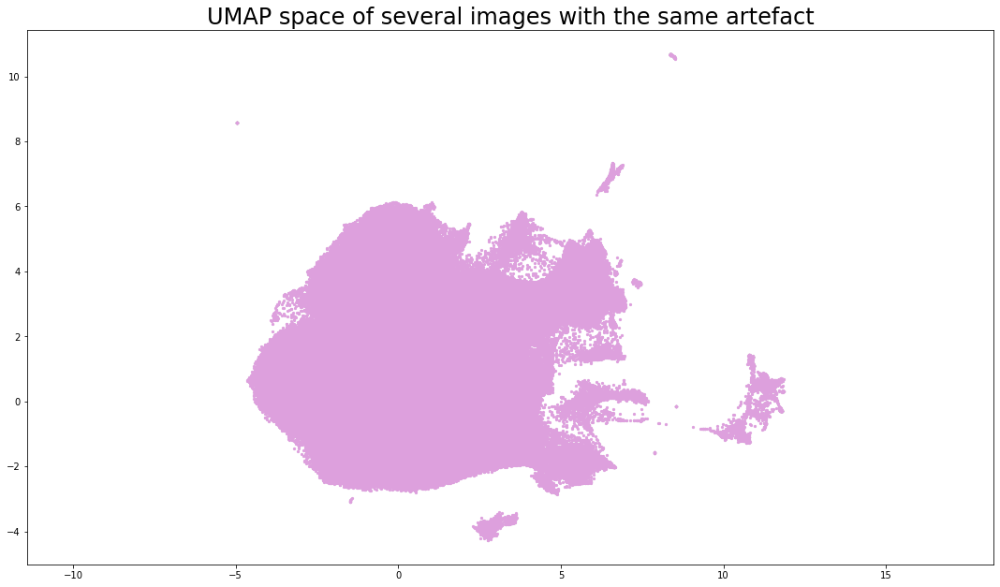

In [5]:
plt.figure(figsize =(18.5, 10.5)) 
plt.scatter(
    embedding[:, 0],
    embedding[:, 1], s=5, c='plum')
plt.gca().set_aspect('equal', 'datalim')
plt.title('UMAP space of several images with the same artefact', fontsize=24)

In [38]:
paths = list(latent.index)

In [ ]:
def getImage(path):
    return OffsetImage(plt.imread(path), zoom = 0.1)

x = embedding[:, 0]
y = embedding[:, 1]
fig, ax = plt.subplots()
fig.set_size_inches(17.5, 13.5)
ax.scatter(x, y) 
#fig = plt.figure(figsize =(7, 6)) 

for x0, y0, path in zip(x, y,paths):
    ab = AnnotationBbox(getImage(path), (x0, y0), frameon=False)
    ax.add_artist(ab)

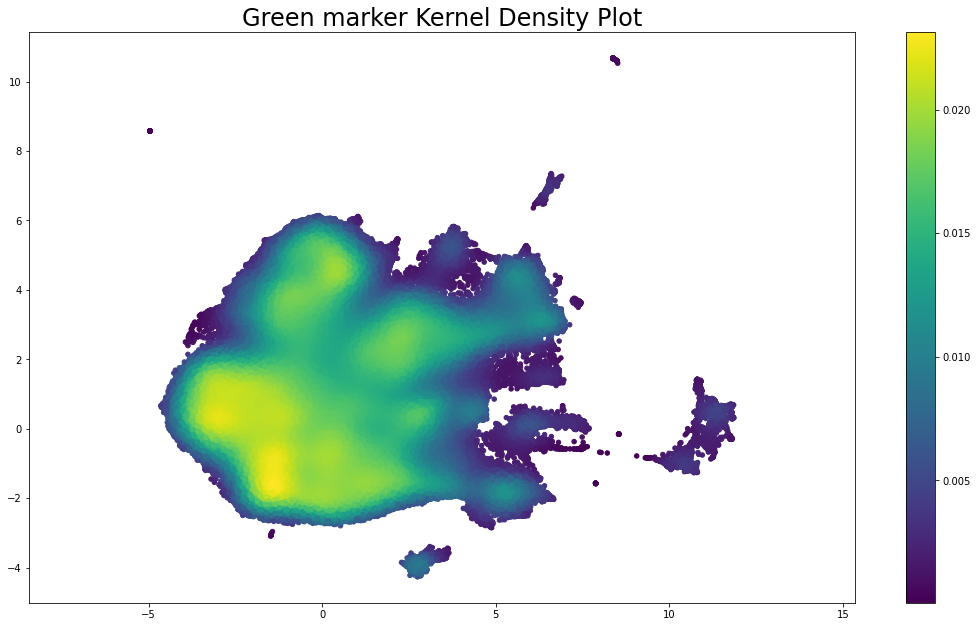

In [6]:
# Calculate the point density
xy = np.vstack([embedding[:, 0],embedding[:, 1]])
z = gaussian_kde(xy)(xy) #density 

fig, ax = plt.subplots()
fig.set_size_inches(18.5, 10.5)
sc = ax.scatter(embedding[:, 0],embedding[:, 1],c=z, s=20)
plt.colorbar(sc)
plt.gca().set_aspect('equal', 'datalim')
plt.title('Green marker Kernel Density Plot', fontsize=24)
plt.show()

In [7]:
#tile X Y density
density_df = pd.DataFrame()
density_df['tile'] = pd.Series(latent.index)

density_df.index = density_df['tile']
density_df.drop(columns=['tile'], inplace = True)

density_df['X'] = embedding[:, 0]
density_df['Y'] = embedding[:, 1]

#xy = np.vstack([embed_12696[:, 0],embed_12696[:, 1]])
#z = gaussian_kde(xy)(xy)
density_df['density'] = z
density_df.head()

,X,Y,density
tile,,,
/mnt/iribhm/TCGA-all/THCA/output/tiles/40X/0.25_TCGA-FK-A4UB-01Z-00-DX1.7D9BFA84-A8EE-494F-B97C-35199782C750.svs/processing/tiles/tile_100_177.png,-1.115338,4.561514,0.013840
/mnt/iribhm/TCGA-all/THCA/output/tiles/40X/0.25_TCGA-FK-A4UB-01Z-00-DX1.7D9BFA84-A8EE-494F-B97C-35199782C750.svs/processing/tiles/tile_100_178.png,-0.616627,5.516278,0.013412
/mnt/iribhm/TCGA-all/THCA/output/tiles/40X/0.25_TCGA-FK-A4UB-01Z-00-DX1.7D9BFA84-A8EE-494F-B97C-35199782C750.svs/processing/tiles/tile_100_179.png,0.449600,2.840681,0.013434
/mnt/iribhm/TCGA-all/THCA/output/tiles/40X/0.25_TCGA-FK-A4UB-01Z-00-DX1.7D9BFA84-A8EE-494F-B97C-35199782C750.svs/processing/tiles/tile_100_180.png,-0.309607,3.434484,0.016984
/mnt/iribhm/TCGA-all/THCA/output/tiles/40X/0.25_TCGA-FK-A4UB-01Z-00-DX1.7D9BFA84-A8EE-494F-B97C-35199782C750.svs/processing/tiles/tile_100_181.png,2.861866,2.507085,0.016504


In [20]:
density_df.to_csv('data/density_kde_cigalat_greenmarker_small.csv', index=False)

In [8]:
low = density_df.loc[density_df['density'] <= 0.005]
low = low.sort_values(by='density')
low.head()

,X,Y,density
tile,,,
/mnt/iribhm/TCGA-all/THCA/output/tiles/40X/0.25_TCGA-FK-A3SD-01Z-00-DX1.62417D7B-3565-49FD-964F-F3C0C4C01CA1.svs/processing/tiles/tile_170_318.png,8.213293,-0.697493,0.000052
/mnt/iribhm/TCGA-all/THCA/output/tiles/40X/0.25_TCGA-FK-A4UB-01Z-00-DX1.7D9BFA84-A8EE-494F-B97C-35199782C750.svs/processing/tiles/tile_251_262.png,7.883162,-1.576249,0.000074
/mnt/iribhm/TCGA-all/THCA/output/tiles/40X/0.25_TCGA-FK-A4UB-01Z-00-DX1.7D9BFA84-A8EE-494F-B97C-35199782C750.svs/processing/tiles/tile_255_264.png,7.882498,-1.576115,0.000074
/mnt/iribhm/TCGA-all/THCA/output/tiles/40X/0.25_TCGA-FK-A4UB-01Z-00-DX1.7D9BFA84-A8EE-494F-B97C-35199782C750.svs/processing/tiles/tile_254_264.png,7.882032,-1.576091,0.000074
/mnt/iribhm/TCGA-all/THCA/output/tiles/40X/0.25_TCGA-FK-A4UB-01Z-00-DX1.7D9BFA84-A8EE-494F-B97C-35199782C750.svs/processing/tiles/tile_254_263.png,7.882388,-1.574136,0.000074


In [25]:
low.shape

(12528, 3)

In [30]:
def show_img(files):
    plt.figure(figsize= (10,10))
    #ind = np.random.randint(0, len(files), 25)
    i=0
    for loc in range(25):
        plt.subplot(5,5,i+1)
        sample = plt.imread(files[loc])
        plt.axis("off")
        plt.imshow(sample)
        plt.savefig('test.png',transparent=True)
        i+=1

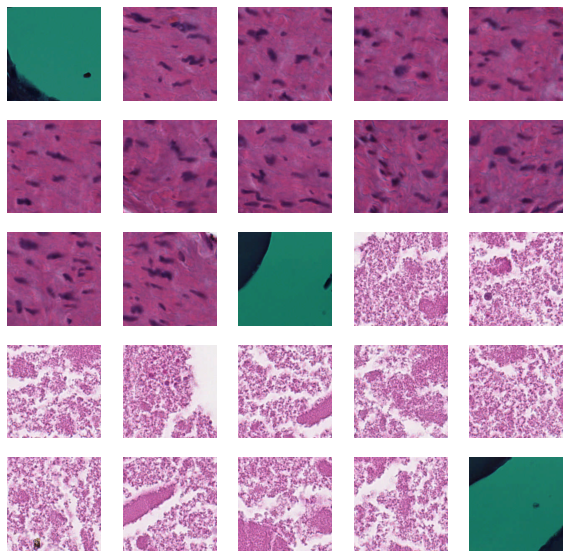

In [31]:
files = list(low.index)
show_img(files)

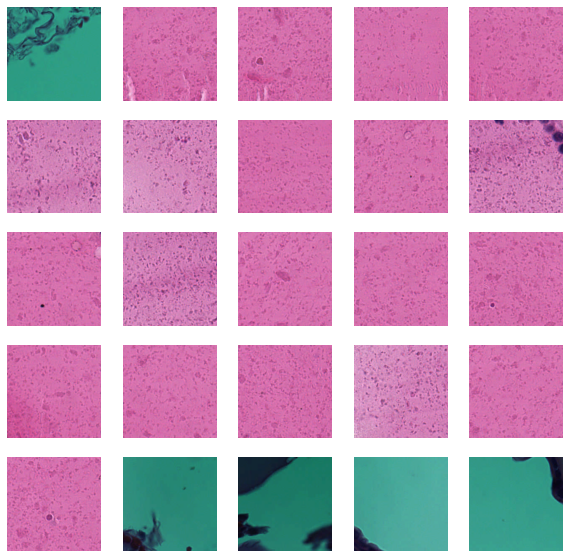

In [32]:
show_img(files[25:50])

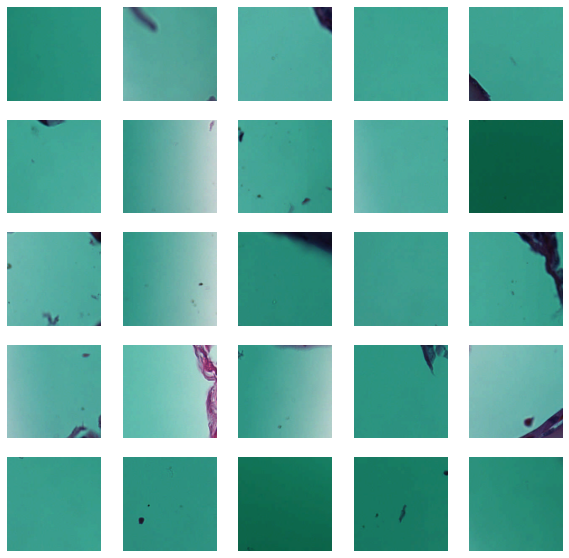

In [33]:
show_img(files[50:75])

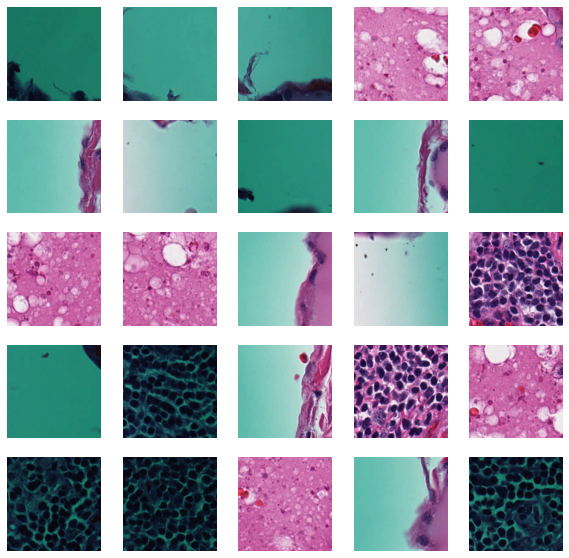

In [34]:
show_img(files[75:100])

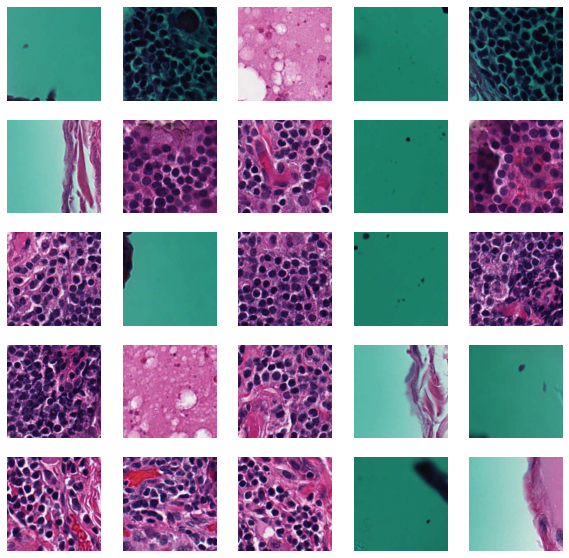

In [37]:
show_img(files[100:125])

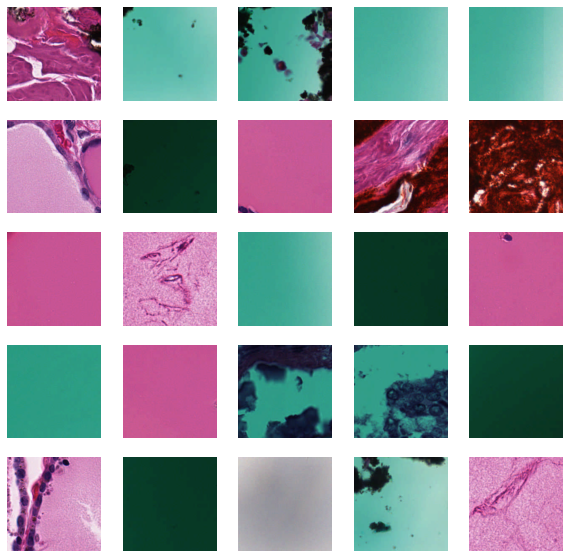

In [36]:
show_img(files[1250:1275])

### BIG DATASET

In [ ]:
latent = pd.read_csv('/mnt/iribhm/people/rcharkao/data/cigalat_greenmarker.csv', index_col ='tile')
latent.drop(columns=['svs'], inplace = True)
var = pd.Series(latent.index).str[:5] + 'iribhm' + pd.Series(latent.index).str[12:]
latent.reset_index(inplace=True)
latent = latent.drop(columns=['tile'])
latent = latent.assign(tile=var.values)
latent = latent.set_index('tile')
latent.head()

In [ ]:
reducer = umap.UMAP()
embedding = reducer.fit_transform(latent)
print(embedding.shape)

plt.figure(figsize =(18.5, 10.5)) 
plt.scatter(
    embedding[:, 0],
    embedding[:, 1], s=5, c='plum')
plt.gca().set_aspect('equal', 'datalim')
plt.title('UMAP space of several images with the same artefact', fontsize=24)

In [ ]:
paths = list(latent.index)
def getImage(path):
    return OffsetImage(plt.imread(path), zoom = 0.1)

x = embedding[:, 0]
y = embedding[:, 1]
fig, ax = plt.subplots()
fig.set_size_inches(17.5, 13.5)
ax.scatter(x, y) 
#fig = plt.figure(figsize =(7, 6)) 

for x0, y0, path in zip(x, y,paths):
    ab = AnnotationBbox(getImage(path), (x0, y0), frameon=False)
    ax.add_artist(ab)

In [ ]:
# Calculate the point density
xy = np.vstack([embedding[:, 0],embedding[:, 1]])
z = gaussian_kde(xy)(xy) #density 

fig, ax = plt.subplots()
fig.set_size_inches(18.5, 10.5)
sc = ax.scatter(embedding[:, 0],embedding[:, 1],c=z, s=20)
plt.colorbar(sc)
plt.gca().set_aspect('equal', 'datalim')
plt.title('Green marker Kernel Density Plot', fontsize=24)
plt.show()

In [ ]:
#tile X Y density
density_df = pd.DataFrame()
density_df['tile'] = pd.Series(latent.index)

density_df.index = density_df['tile']
density_df.drop(columns=['tile'], inplace = True)

density_df['X'] = embedding[:, 0]
density_df['Y'] = embedding[:, 1]

#xy = np.vstack([embed_12696[:, 0],embed_12696[:, 1]])
#z = gaussian_kde(xy)(xy)
density_df['density'] = z
density_df.to_csv('data/density_kde_cigalat_greenmarker.csv', index=False)

low = density_df.loc[density_df['density'] <= 0.005]
low = low.sort_values(by='density')
low.head()


In [ ]:
def show_img(files):
    plt.figure(figsize= (10,10))
    #ind = np.random.randint(0, len(files), 25)
    i=0
    for loc in range(25):
        plt.subplot(5,5,i+1)
        sample = plt.imread(files[loc])
        plt.axis("off")
        plt.imshow(sample)
        plt.savefig('test.png',transparent=True)
        i+=1
        
files = list(low.index)
show_img(files)

## With new latent space green marker only

In [2]:
latent = pd.read_csv('/mnt/iribhm/people/rcharkao/data/newlat_greenmarker.csv', index_col ='tile')
latent.drop(columns=['svs'], inplace = True)
latent.head()

,0,1,2,3,4,5,6,7,8,9,...,374,375,376,377,378,379,380,381,382,383
tile,,,,,,,,,,,,,,,,,,,,,
/mnt/iribhm/TCGA-all/THCA/output/tiles/40X/0.25_TCGA-FK-A4UB-01Z-00-DX1.7D9BFA84-A8EE-494F-B97C-35199782C750.svs/processing/tiles/tile_100_177.png,-1.537865,0.910333,2.869391,-2.806383,8.662053,-4.369540,1.494190,3.958089,4.128901,-5.918980,...,0.866798,-1.827076,-1.312351,1.120399,-6.416248,-7.885462,-0.783103,1.993109,-2.358938,-0.136117
/mnt/iribhm/TCGA-all/THCA/output/tiles/40X/0.25_TCGA-FK-A4UB-01Z-00-DX1.7D9BFA84-A8EE-494F-B97C-35199782C750.svs/processing/tiles/tile_100_178.png,-4.101447,-0.004365,1.570411,-0.576712,9.394551,-2.699886,-0.081529,3.515506,4.850123,-1.704638,...,1.577668,-6.009461,-5.121044,0.876944,-3.232808,-2.006985,0.128606,-0.684823,-1.160287,0.231282
/mnt/iribhm/TCGA-all/THCA/output/tiles/40X/0.25_TCGA-FK-A4UB-01Z-00-DX1.7D9BFA84-A8EE-494F-B97C-35199782C750.svs/processing/tiles/tile_100_179.png,-1.102137,1.467428,-2.534090,1.886115,4.281866,-3.376344,0.358109,3.825947,4.877830,-2.093781,...,-1.845708,-4.441942,-1.396523,2.412727,-1.187758,-1.267416,-5.935054,-2.405793,-0.422648,1.725823
/mnt/iribhm/TCGA-all/THCA/output/tiles/40X/0.25_TCGA-FK-A4UB-01Z-00-DX1.7D9BFA84-A8EE-494F-B97C-35199782C750.svs/processing/tiles/tile_100_180.png,-0.864536,2.492217,3.590527,-1.293157,4.232195,-3.558293,-0.224577,-0.154040,4.768988,-3.752841,...,-1.971957,-0.288851,-6.834853,1.344245,-4.592380,-0.353692,-0.143149,-2.551862,-3.618392,1.343468
/mnt/iribhm/TCGA-all/THCA/output/tiles/40X/0.25_TCGA-FK-A4UB-01Z-00-DX1.7D9BFA84-A8EE-494F-B97C-35199782C750.svs/processing/tiles/tile_100_181.png,0.221777,-0.000148,-0.991865,2.164590,6.243944,-0.685354,-0.019310,1.904872,1.665612,-3.785918,...,-0.624727,-7.889576,0.280785,2.094450,-0.284801,0.541928,-4.602244,-1.869932,0.490027,1.929395


In [3]:
data = latent.copy()

In [ ]:
xy = np.vstack([pd.DataFrame(data).iloc[:,i] for i in range(len(pd.DataFrame(data).columns))])

print(xy.shape)

z = gaussian_kde(xy)(xy)

print(z.shape)

(384, 576396)


In [ ]:
z.min()

In [ ]:
z.max()

In [ ]:
density_indices = np.argsort(z)

In [ ]:
paths =[]
for i in density_indices[-100:]: 
    paths.append(latent.iloc[i].name)

In [ ]:
def show_img(files):
    plt.figure(figsize= (10,10))
    #ind = np.random.randint(0, len(files), 25)
    i=0
    for loc in range(25):
        plt.subplot(5,5,i+1)
        sample = plt.imread(files[loc])
        plt.axis("off")
        plt.imshow(sample)
        #plt.savefig('test.png',transparent=True)
        i+=1

In [ ]:
show_img(paths) #0-25

In [ ]:
show_img(paths[25:50]) #25-50

## With new latent space green marker + UMAP

building the bigger dataset sample

In [ ]:
lat = pd.read_feather('/mnt/iribhm/people/zzhang/code/TCGA_cluster/resmlp_12_224/combined_latent_space_fullpath_iribhm.feather')
lat.head()

In [3]:
green_marker= ['TCGA-FK-A4UB-01Z-00-DX1.7D9BFA84-A8EE-494F-B97C-35199782C750.svs',
'TCGA-FK-A3SD-01Z-00-DX1.62417D7B-3565-49FD-964F-F3C0C4C01CA1.svs', 'TCGA-FK-A3SH-01Z-00-DX1.2A218FE8-CA0B-4780-AB2C-03AD4569D10C.svs']
#,'TCGA-FK-A3SE-01Z-00-DX1.D32CC876-F322-4C96-A3A6-232197DFFEFB.svs', 'TCGA-FK-A3SB-01Z-00-DX1.F8150243-853F-4B0C-A1B7-A4F8A8AA8E77.svs', 
#'TCGA-FK-A3S3-01Z-00-DX1.27050211-E584-4001-B256-AC113B08FAA0.svs', 'TCGA-FK-A3SG-01Z-00-DX1.79234024-8AD3-49F7-88FD-7E488CE77793.svs']


In [4]:
l = []
for i in range(len(green_marker)):
    df = lat.loc[lat['svs']==green_marker[i]]
    l.append(df)
df = pd.concat(l)
df.head()

,tile,svs,0,1,2,3,4,5,6,7,...,374,375,376,377,378,379,380,381,382,383
2111754,/mnt/iribhm/TCGA-all/THCA/output/tiles/40X/0.2...,TCGA-FK-A4UB-01Z-00-DX1.7D9BFA84-A8EE-494F-B97...,-1.537865,0.910333,2.869391,-2.806383,8.662053,-4.369540,1.494190,3.958089,...,0.866798,-1.827076,-1.312351,1.120399,-6.416248,-7.885462,-0.783103,1.993109,-2.358938,-0.136117
2111755,/mnt/iribhm/TCGA-all/THCA/output/tiles/40X/0.2...,TCGA-FK-A4UB-01Z-00-DX1.7D9BFA84-A8EE-494F-B97...,-4.101447,-0.004365,1.570411,-0.576712,9.394551,-2.699886,-0.081529,3.515506,...,1.577668,-6.009461,-5.121044,0.876944,-3.232808,-2.006985,0.128606,-0.684823,-1.160287,0.231282
2111756,/mnt/iribhm/TCGA-all/THCA/output/tiles/40X/0.2...,TCGA-FK-A4UB-01Z-00-DX1.7D9BFA84-A8EE-494F-B97...,-1.102137,1.467428,-2.534090,1.886115,4.281866,-3.376344,0.358109,3.825947,...,-1.845708,-4.441942,-1.396523,2.412727,-1.187758,-1.267416,-5.935054,-2.405793,-0.422648,1.725823
2111757,/mnt/iribhm/TCGA-all/THCA/output/tiles/40X/0.2...,TCGA-FK-A4UB-01Z-00-DX1.7D9BFA84-A8EE-494F-B97...,-0.864536,2.492217,3.590527,-1.293157,4.232195,-3.558293,-0.224577,-0.154040,...,-1.971957,-0.288851,-6.834853,1.344245,-4.592380,-0.353692,-0.143149,-2.551862,-3.618392,1.343468
2111758,/mnt/iribhm/TCGA-all/THCA/output/tiles/40X/0.2...,TCGA-FK-A4UB-01Z-00-DX1.7D9BFA84-A8EE-494F-B97...,0.221777,-0.000148,-0.991865,2.164590,6.243944,-0.685354,-0.019310,1.904872,...,-0.624727,-7.889576,0.280785,2.094450,-0.284801,0.541928,-4.602244,-1.869932,0.490027,1.929395


In [5]:
df.shape

(239903, 386)

In [6]:
df.to_csv('data/newlat_greenmarker_small.csv', index=False)

In [2]:
latent = pd.read_csv('/mnt/iribhm/people/rcharkao/data/newlat_greenmarker.csv', index_col ='tile')
latent.drop(columns=['svs'], inplace = True)
latent.head()

,0,1,2,3,4,5,6,7,8,9,...,374,375,376,377,378,379,380,381,382,383
tile,,,,,,,,,,,,,,,,,,,,,
/mnt/iribhm/TCGA-all/THCA/output/tiles/40X/0.25_TCGA-FK-A4UB-01Z-00-DX1.7D9BFA84-A8EE-494F-B97C-35199782C750.svs/processing/tiles/tile_100_177.png,-1.537865,0.910333,2.869391,-2.806383,8.662053,-4.369540,1.494190,3.958089,4.128901,-5.918980,...,0.866798,-1.827076,-1.312351,1.120399,-6.416248,-7.885462,-0.783103,1.993109,-2.358938,-0.136117
/mnt/iribhm/TCGA-all/THCA/output/tiles/40X/0.25_TCGA-FK-A4UB-01Z-00-DX1.7D9BFA84-A8EE-494F-B97C-35199782C750.svs/processing/tiles/tile_100_178.png,-4.101447,-0.004365,1.570411,-0.576712,9.394551,-2.699886,-0.081529,3.515506,4.850123,-1.704638,...,1.577668,-6.009461,-5.121044,0.876944,-3.232808,-2.006985,0.128606,-0.684823,-1.160287,0.231282
/mnt/iribhm/TCGA-all/THCA/output/tiles/40X/0.25_TCGA-FK-A4UB-01Z-00-DX1.7D9BFA84-A8EE-494F-B97C-35199782C750.svs/processing/tiles/tile_100_179.png,-1.102137,1.467428,-2.534090,1.886115,4.281866,-3.376344,0.358109,3.825947,4.877830,-2.093781,...,-1.845708,-4.441942,-1.396523,2.412727,-1.187758,-1.267416,-5.935054,-2.405793,-0.422648,1.725823
/mnt/iribhm/TCGA-all/THCA/output/tiles/40X/0.25_TCGA-FK-A4UB-01Z-00-DX1.7D9BFA84-A8EE-494F-B97C-35199782C750.svs/processing/tiles/tile_100_180.png,-0.864536,2.492217,3.590527,-1.293157,4.232195,-3.558293,-0.224577,-0.154040,4.768988,-3.752841,...,-1.971957,-0.288851,-6.834853,1.344245,-4.592380,-0.353692,-0.143149,-2.551862,-3.618392,1.343468
/mnt/iribhm/TCGA-all/THCA/output/tiles/40X/0.25_TCGA-FK-A4UB-01Z-00-DX1.7D9BFA84-A8EE-494F-B97C-35199782C750.svs/processing/tiles/tile_100_181.png,0.221777,-0.000148,-0.991865,2.164590,6.243944,-0.685354,-0.019310,1.904872,1.665612,-3.785918,...,-0.624727,-7.889576,0.280785,2.094450,-0.284801,0.541928,-4.602244,-1.869932,0.490027,1.929395


In [3]:
reducer = umap.UMAP()
embedding = reducer.fit_transform(latent)
embedding.shape

(576396, 2)

Text(0.5, 1.0, 'Green marker TCGA-FK small dataset')

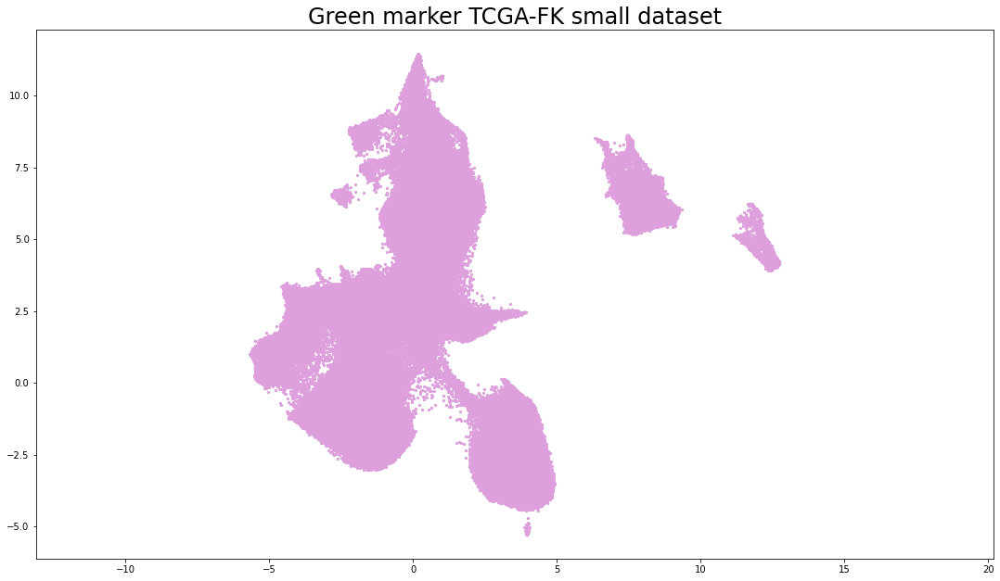

In [9]:
plt.figure(figsize =(18.5, 10.5)) 
plt.scatter(
    embedding[:, 0],
    embedding[:, 1], s=5, c='plum')
plt.gca().set_aspect('equal', 'datalim')
plt.title('Green marker TCGA-FK small dataset', fontsize=24)

Text(0.5, 1.0, 'Green marker TCGA-FK')

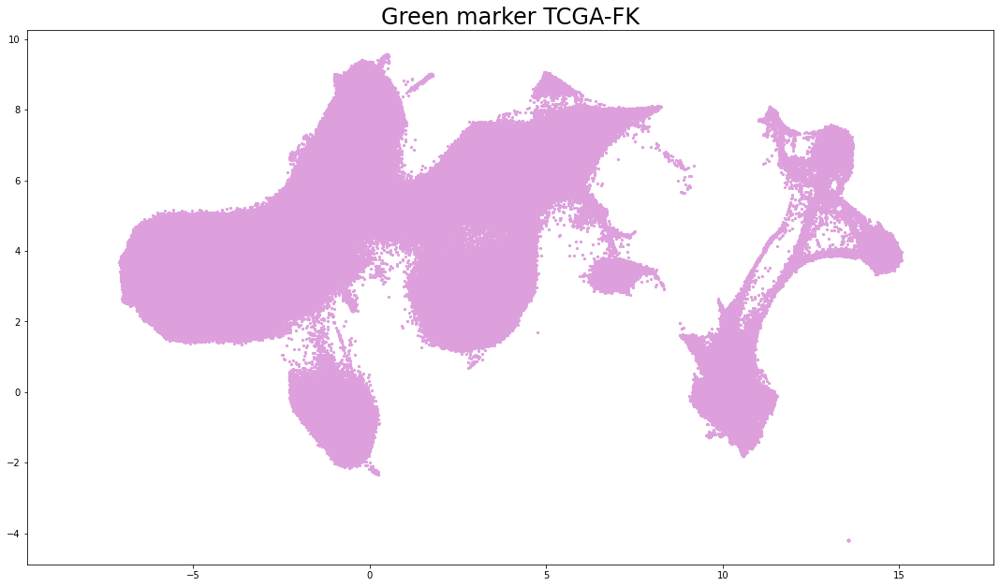

In [4]:
plt.figure(figsize =(18.5, 10.5)) 
plt.scatter(
    embedding[:, 0],
    embedding[:, 1], s=5, c='plum')
plt.gca().set_aspect('equal', 'datalim')
plt.title('Green marker TCGA-FK', fontsize=24)

In [5]:
paths = list(latent.index)

In [15]:
embed = pd.DataFrame(embedding)
embed['tile'] = latent.index

In [16]:
embed

,0,1,tile
0,0.088907,7.642859,/mnt/iribhm/TCGA-all/THCA/output/tiles/40X/0.2...
1,-0.007260,8.324522,/mnt/iribhm/TCGA-all/THCA/output/tiles/40X/0.2...
2,1.760187,2.885964,/mnt/iribhm/TCGA-all/THCA/output/tiles/40X/0.2...
3,0.494689,7.952372,/mnt/iribhm/TCGA-all/THCA/output/tiles/40X/0.2...
4,4.153656,3.797642,/mnt/iribhm/TCGA-all/THCA/output/tiles/40X/0.2...
...,...,...,...
576391,-6.001324,2.034710,/mnt/iribhm/TCGA-all/THCA/output/tiles/40X/0.2...
576392,-6.015998,2.551763,/mnt/iribhm/TCGA-all/THCA/output/tiles/40X/0.2...
576393,-5.530700,2.031696,/mnt/iribhm/TCGA-all/THCA/output/tiles/40X/0.2...
576394,-6.191555,4.687438,/mnt/iribhm/TCGA-all/THCA/output/tiles/40X/0.2...


In [5]:
def getImage(path):
    return OffsetImage(plt.imread(path), zoom = 0.1)

In [6]:
type(embedding)

numpy.ndarray

In [23]:
subembed = embed.sample(n = 250000)
paths = subembed['tile']

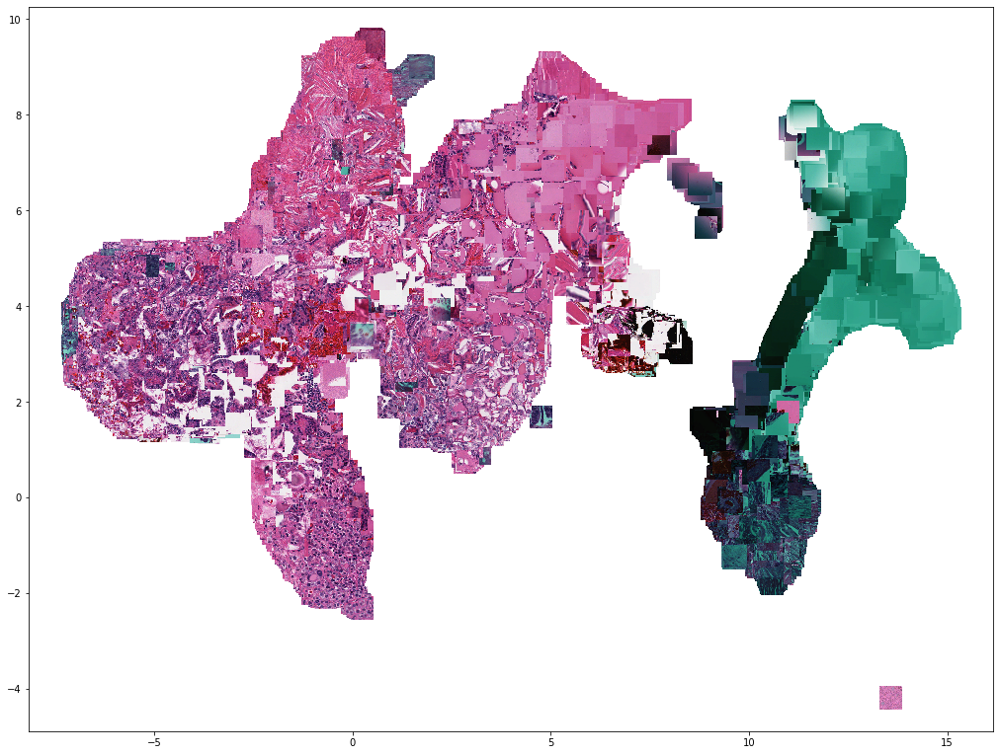

In [24]:
x = subembed.iloc[:, 0]
y = subembed.iloc[:, 1]
fig, ax = plt.subplots()
fig.set_size_inches(17.5, 13.5)
ax.scatter(x, y) 
#fig = plt.figure(figsize =(7, 6)) 

for x0, y0, path in zip(x, y,paths):
    ab = AnnotationBbox(getImage(path), (x0, y0), frameon=False)
    ax.add_artist(ab)

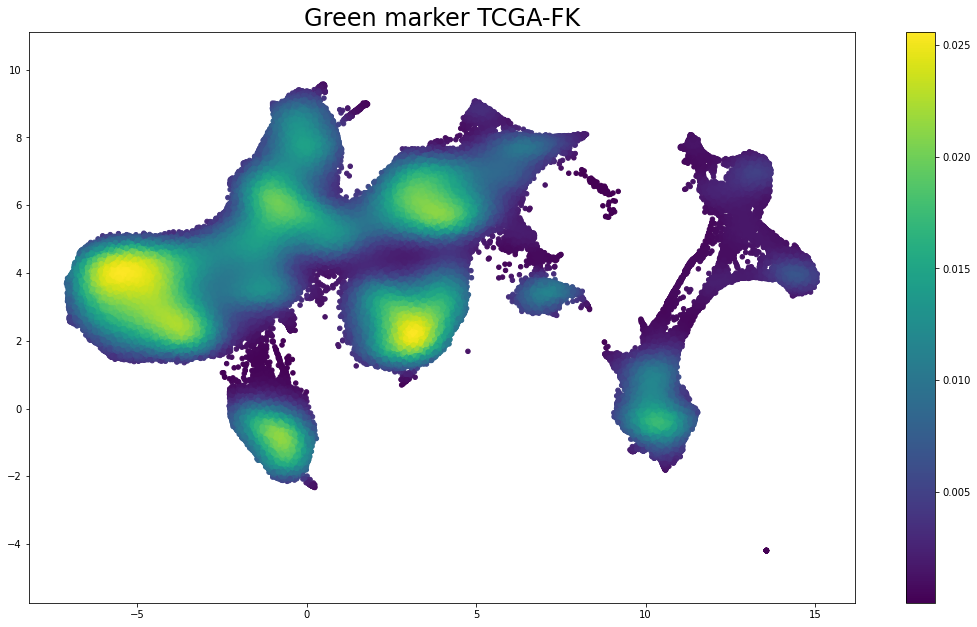

In [25]:
# Calculate the point density
xy = np.vstack([embedding[:, 0],embedding[:, 1]])
z = gaussian_kde(xy)(xy) #density 

fig, ax = plt.subplots()
fig.set_size_inches(18.5, 10.5)
sc = ax.scatter(embedding[:, 0],embedding[:, 1],c=z, s=20)
plt.colorbar(sc)
plt.gca().set_aspect('equal', 'datalim')
plt.title('Green marker TCGA-FK', fontsize=24)
plt.show()


In [26]:
#tile X Y density
density_df = pd.DataFrame()
density_df['tile'] = pd.Series(latent.index)

density_df.index = density_df['tile']
density_df.drop(columns=['tile'], inplace = True)

density_df['X'] = embedding[:, 0]
density_df['Y'] = embedding[:, 1]

#xy = np.vstack([embed_12696[:, 0],embed_12696[:, 1]])
#z = gaussian_kde(xy)(xy)
density_df['density'] = z
density_df.head()

,X,Y,density
tile,,,
/mnt/iribhm/TCGA-all/THCA/output/tiles/40X/0.25_TCGA-FK-A4UB-01Z-00-DX1.7D9BFA84-A8EE-494F-B97C-35199782C750.svs/processing/tiles/tile_100_177.png,0.088907,7.642859,0.014324
/mnt/iribhm/TCGA-all/THCA/output/tiles/40X/0.25_TCGA-FK-A4UB-01Z-00-DX1.7D9BFA84-A8EE-494F-B97C-35199782C750.svs/processing/tiles/tile_100_178.png,-0.007260,8.324522,0.013036
/mnt/iribhm/TCGA-all/THCA/output/tiles/40X/0.25_TCGA-FK-A4UB-01Z-00-DX1.7D9BFA84-A8EE-494F-B97C-35199782C750.svs/processing/tiles/tile_100_179.png,1.760187,2.885964,0.011824
/mnt/iribhm/TCGA-all/THCA/output/tiles/40X/0.25_TCGA-FK-A4UB-01Z-00-DX1.7D9BFA84-A8EE-494F-B97C-35199782C750.svs/processing/tiles/tile_100_180.png,0.494689,7.952372,0.011585
/mnt/iribhm/TCGA-all/THCA/output/tiles/40X/0.25_TCGA-FK-A4UB-01Z-00-DX1.7D9BFA84-A8EE-494F-B97C-35199782C750.svs/processing/tiles/tile_100_181.png,4.153656,3.797642,0.010930


In [27]:
low = density_df.loc[density_df['density'] <= 0.005]
low = low.sort_values(by='density')
low.head()

,X,Y,density
tile,,,
/mnt/iribhm/TCGA-all/THCA/output/tiles/40X/0.25_TCGA-FK-A3SE-01Z-00-DX1.D32CC876-F322-4C96-A3A6-232197DFFEFB.svs/processing/tiles/tile_148_239.png,8.907996,5.646948,0.000025
/mnt/iribhm/TCGA-all/THCA/output/tiles/40X/0.25_TCGA-FK-A3SG-01Z-00-DX1.79234024-8AD3-49F7-88FD-7E488CE77793.svs/processing/tiles/tile_43_190.png,8.875512,5.650872,0.000025
/mnt/iribhm/TCGA-all/THCA/output/tiles/40X/0.25_TCGA-FK-A3SE-01Z-00-DX1.D32CC876-F322-4C96-A3A6-232197DFFEFB.svs/processing/tiles/tile_108_201.png,8.817286,5.662768,0.000025
/mnt/iribhm/TCGA-all/THCA/output/tiles/40X/0.25_TCGA-FK-A3SG-01Z-00-DX1.79234024-8AD3-49F7-88FD-7E488CE77793.svs/processing/tiles/tile_49_143.png,8.825789,5.675021,0.000026
/mnt/iribhm/TCGA-all/THCA/output/tiles/40X/0.25_TCGA-FK-A3SE-01Z-00-DX1.D32CC876-F322-4C96-A3A6-232197DFFEFB.svs/processing/tiles/tile_68_118.png,8.986391,5.759454,0.000031


In [28]:
def show_img(files):
    plt.figure(figsize= (10,10))
    #ind = np.random.randint(0, len(files), 25)
    i=0
    for loc in range(25):
        plt.subplot(5,5,i+1)
        sample = plt.imread(files[loc])
        plt.axis("off")
        plt.imshow(sample)
        i+=1

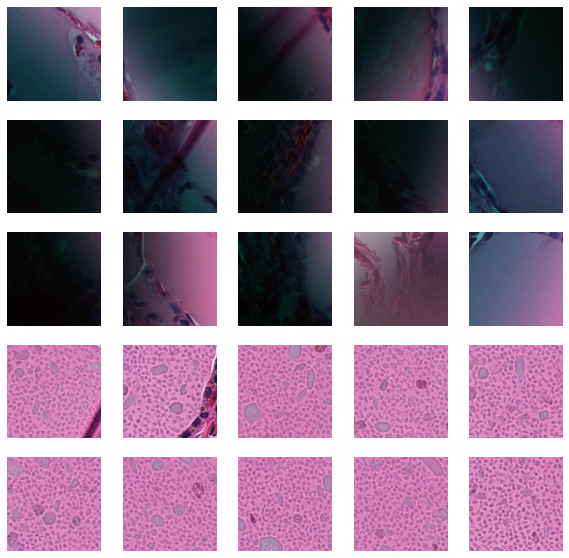

In [29]:
files = list(low.index) 
show_img(files[:25])

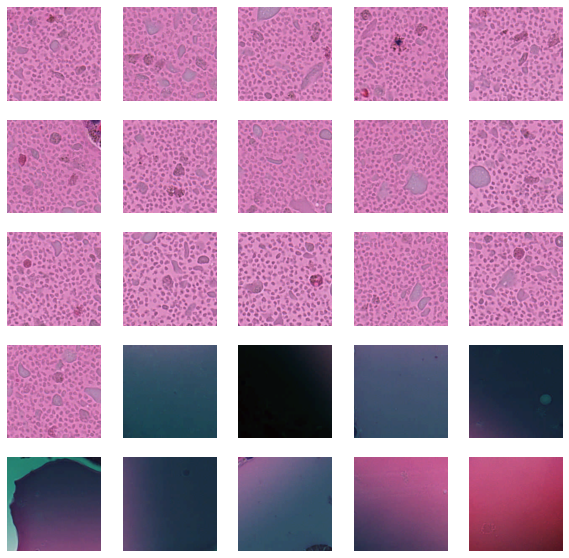

In [32]:
show_img(files[25:50])

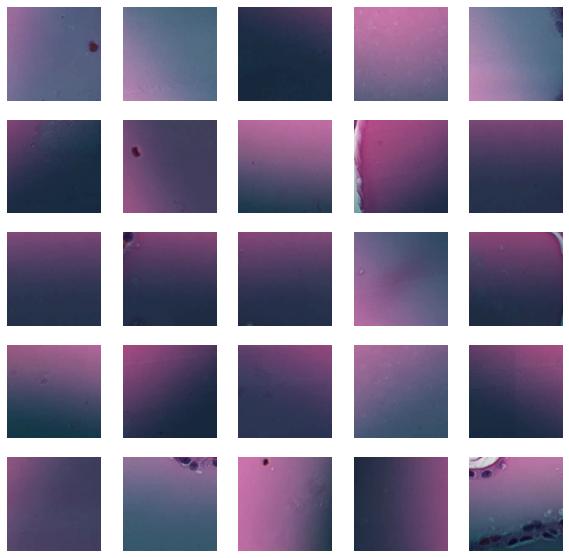

In [30]:
show_img(files[75:100])

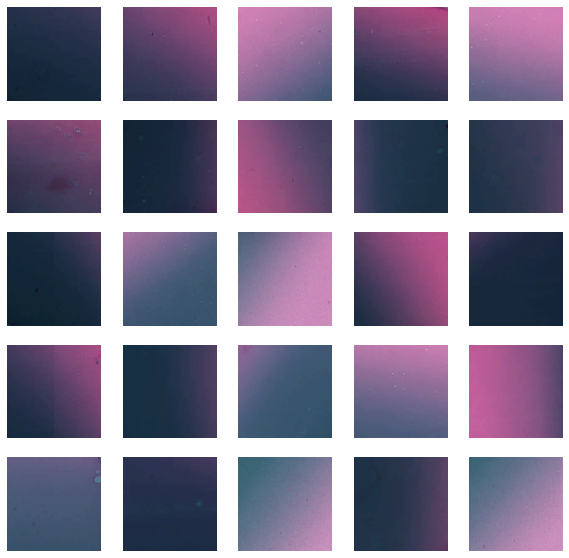

In [31]:
show_img(files[50:75])

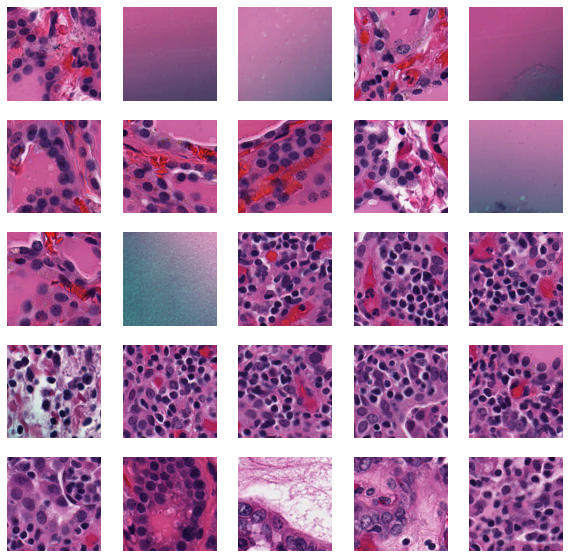

In [33]:
show_img(files[100:125])

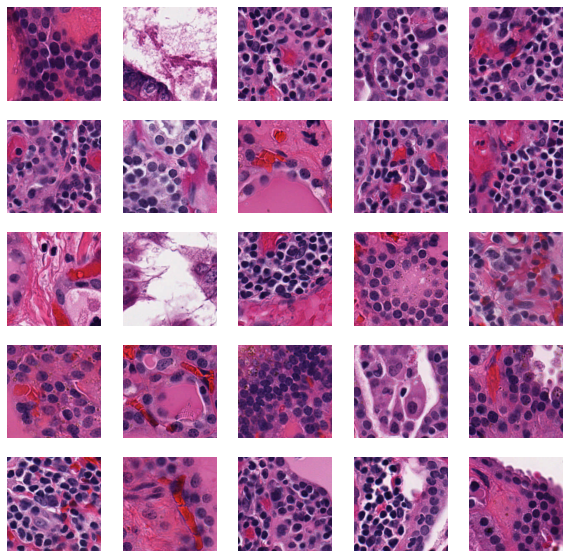

In [36]:
show_img(files[125:150])

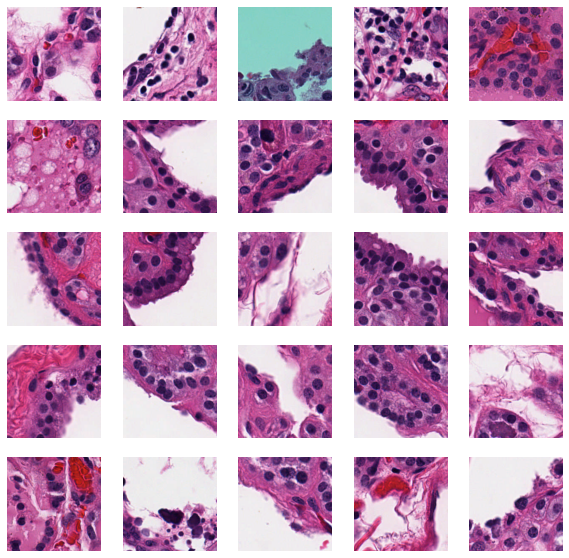

In [37]:
show_img(files[150:175])

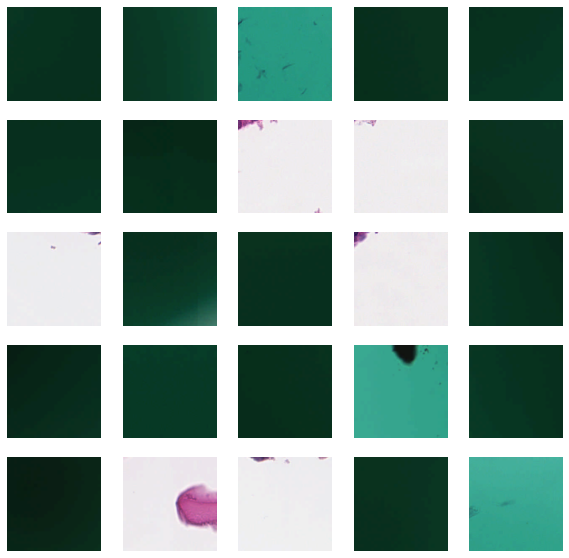

In [38]:
show_img(files[1000:1025])

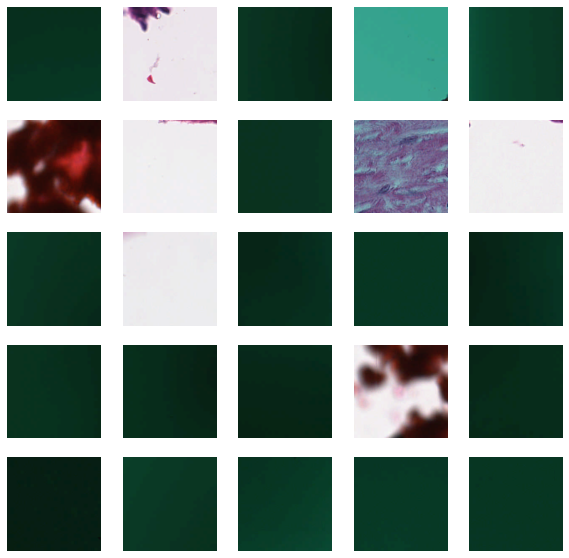

In [39]:
show_img(files[1025:1050])

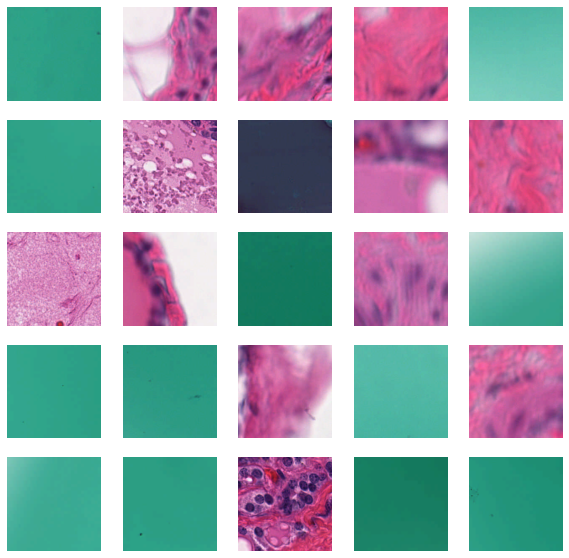

In [40]:
show_img(files[10000:10025])

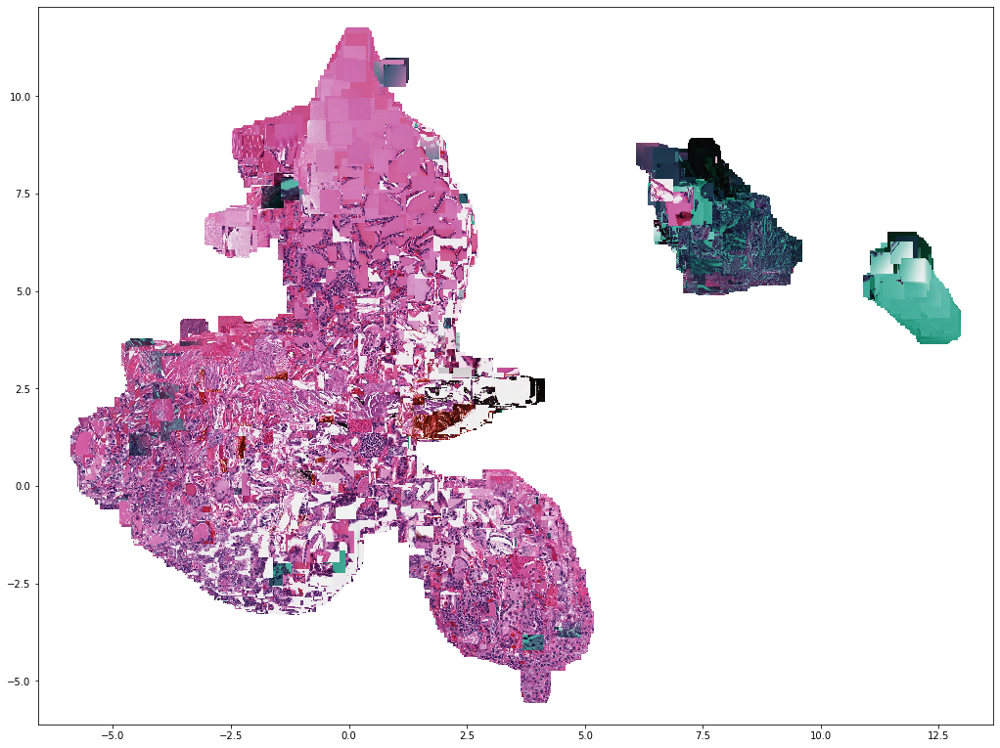

In [11]:
def getImage(path):
    return OffsetImage(plt.imread(path), zoom = 0.1)

x = embedding[:, 0]
y = embedding[:, 1]
fig, ax = plt.subplots()
fig.set_size_inches(17.5, 13.5)
ax.scatter(x, y) 
#fig = plt.figure(figsize =(7, 6)) 

for x0, y0, path in zip(x, y,paths):
    ab = AnnotationBbox(getImage(path), (x0, y0), frameon=False)
    ax.add_artist(ab)
#small dataset

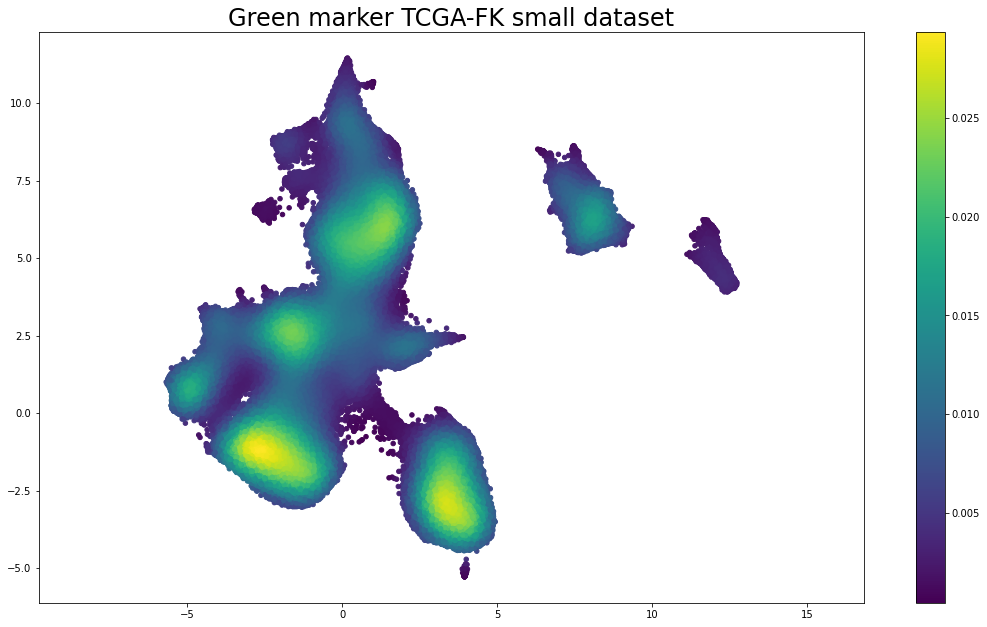

In [12]:
# Calculate the point density
xy = np.vstack([embedding[:, 0],embedding[:, 1]])
z = gaussian_kde(xy)(xy) #density 

fig, ax = plt.subplots()
fig.set_size_inches(18.5, 10.5)
sc = ax.scatter(embedding[:, 0],embedding[:, 1],c=z, s=20)
plt.colorbar(sc)
plt.gca().set_aspect('equal', 'datalim')
plt.title('Green marker TCGA-FK small dataset', fontsize=24)
plt.show()

In [13]:
#tile X Y density
density_df = pd.DataFrame()
density_df['tile'] = pd.Series(latent.index)

density_df.index = density_df['tile']
density_df.drop(columns=['tile'], inplace = True)

density_df['X'] = embedding[:, 0]
density_df['Y'] = embedding[:, 1]

#xy = np.vstack([embed_12696[:, 0],embed_12696[:, 1]])
#z = gaussian_kde(xy)(xy)
density_df['density'] = z
density_df.head()

,X,Y,density
tile,,,
/mnt/iribhm/TCGA-all/THCA/output/tiles/40X/0.25_TCGA-FK-A4UB-01Z-00-DX1.7D9BFA84-A8EE-494F-B97C-35199782C750.svs/processing/tiles/tile_100_177.png,-3.474954,2.649861,0.009412
/mnt/iribhm/TCGA-all/THCA/output/tiles/40X/0.25_TCGA-FK-A4UB-01Z-00-DX1.7D9BFA84-A8EE-494F-B97C-35199782C750.svs/processing/tiles/tile_100_178.png,-2.312882,2.003922,0.013315
/mnt/iribhm/TCGA-all/THCA/output/tiles/40X/0.25_TCGA-FK-A4UB-01Z-00-DX1.7D9BFA84-A8EE-494F-B97C-35199782C750.svs/processing/tiles/tile_100_179.png,-3.942460,1.520249,0.009187
/mnt/iribhm/TCGA-all/THCA/output/tiles/40X/0.25_TCGA-FK-A4UB-01Z-00-DX1.7D9BFA84-A8EE-494F-B97C-35199782C750.svs/processing/tiles/tile_100_180.png,-3.737132,2.662327,0.010004
/mnt/iribhm/TCGA-all/THCA/output/tiles/40X/0.25_TCGA-FK-A4UB-01Z-00-DX1.7D9BFA84-A8EE-494F-B97C-35199782C750.svs/processing/tiles/tile_100_181.png,-5.095115,1.598463,0.007983


In [14]:
low = density_df.loc[density_df['density'] <= 0.005]
low = low.sort_values(by='density')
low.head()

,X,Y,density
tile,,,
/mnt/iribhm/TCGA-all/THCA/output/tiles/40X/0.25_TCGA-FK-A3SH-01Z-00-DX1.2A218FE8-CA0B-4780-AB2C-03AD4569D10C.svs/processing/tiles/tile_298_191.png,1.272512,-1.184920,0.000422
/mnt/iribhm/TCGA-all/THCA/output/tiles/40X/0.25_TCGA-FK-A3SH-01Z-00-DX1.2A218FE8-CA0B-4780-AB2C-03AD4569D10C.svs/processing/tiles/tile_338_300.png,0.773634,-0.755462,0.000463
/mnt/iribhm/TCGA-all/THCA/output/tiles/40X/0.25_TCGA-FK-A3SD-01Z-00-DX1.62417D7B-3565-49FD-964F-F3C0C4C01CA1.svs/processing/tiles/tile_175_75.png,0.651433,-0.855689,0.000493
/mnt/iribhm/TCGA-all/THCA/output/tiles/40X/0.25_TCGA-FK-A3SD-01Z-00-DX1.62417D7B-3565-49FD-964F-F3C0C4C01CA1.svs/processing/tiles/tile_305_84.png,0.624366,-0.874993,0.000521
/mnt/iribhm/TCGA-all/THCA/output/tiles/40X/0.25_TCGA-FK-A3SD-01Z-00-DX1.62417D7B-3565-49FD-964F-F3C0C4C01CA1.svs/processing/tiles/tile_300_76.png,0.553633,-0.923833,0.000637


In [20]:
low.shape

(12456, 3)

In [16]:
def show_img(files):
    plt.figure(figsize= (10,10))
    #ind = np.random.randint(0, len(files), 25)
    i=0
    for loc in range(25):
        plt.subplot(5,5,i+1)
        sample = plt.imread(files[loc])
        plt.axis("off")
        plt.imshow(sample)
        i+=1

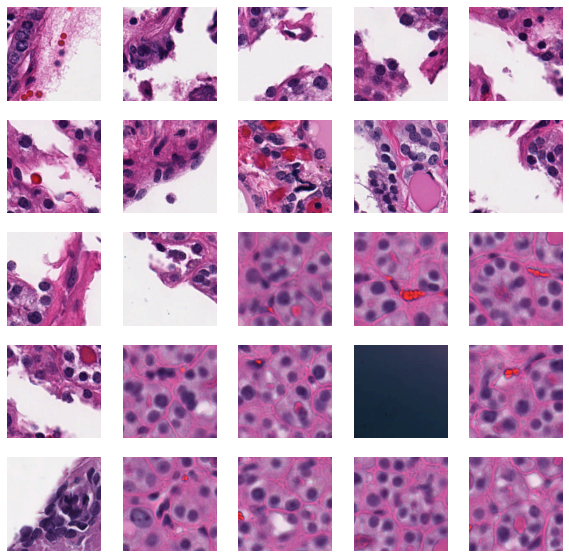

In [17]:
files = list(low.index) 
show_img(files[:25])

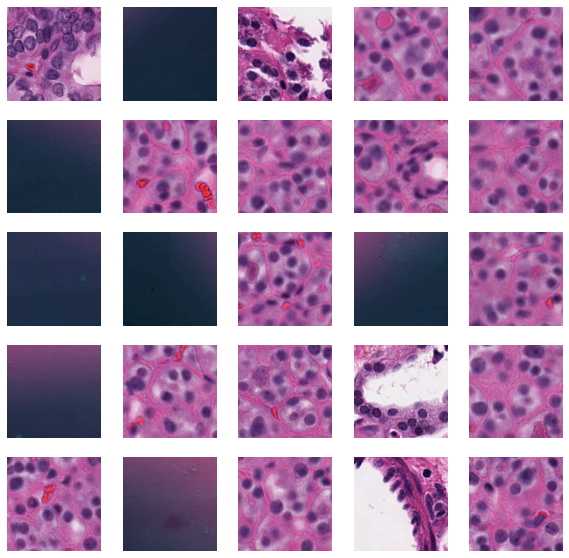

In [18]:
show_img(files[25:50])

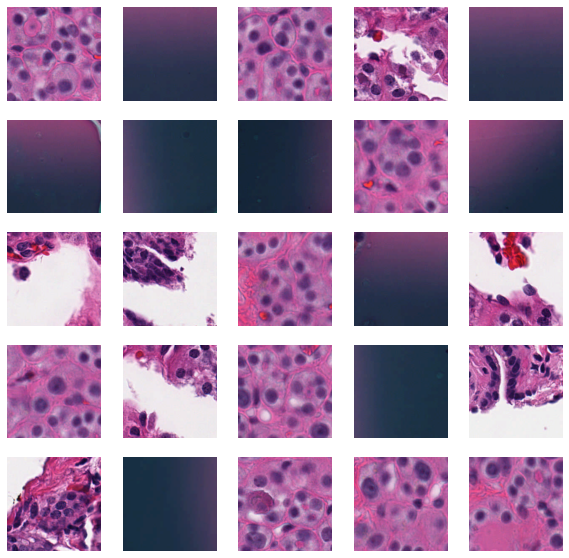

In [22]:
show_img(files[50:75])

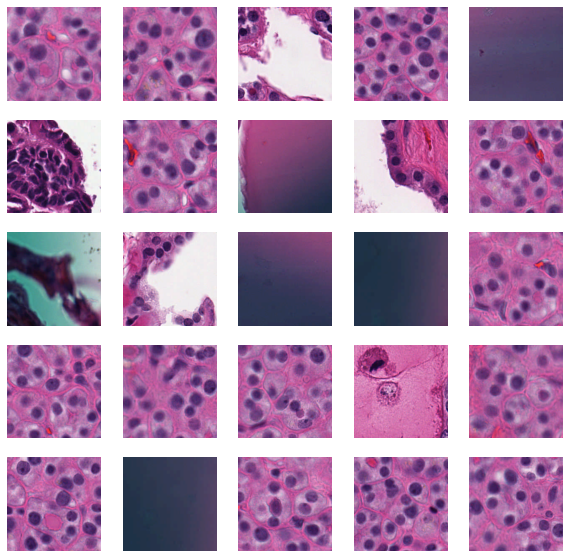

In [23]:
show_img(files[75:100])

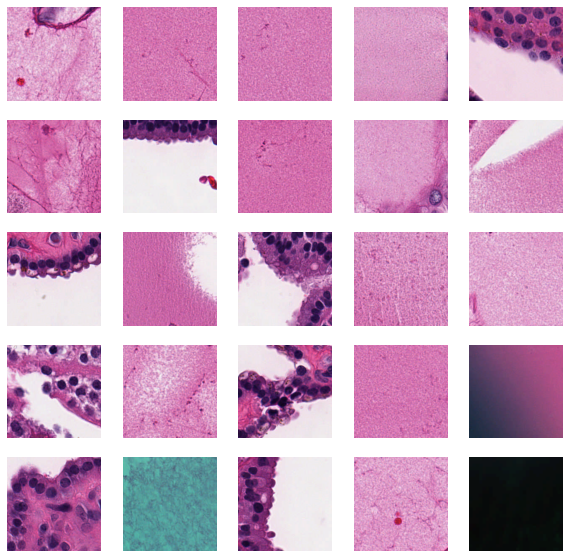

In [21]:
show_img(files[1000:1025])

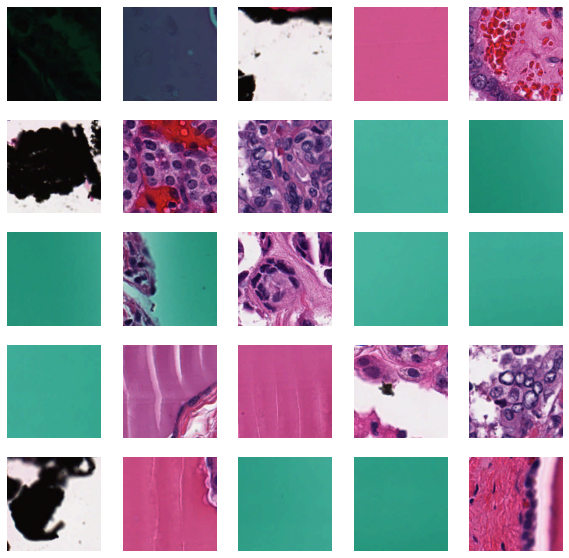

In [27]:
show_img(files[10000:10025])

In [25]:
pmap = pacmap.PaCMAP(n_dims=2, n_neighbors=40) 
embed = pmap.fit_transform(latent)

Text(0.5, 1.0, 'Green marker TCGA-FK small dataset PaCMAP')

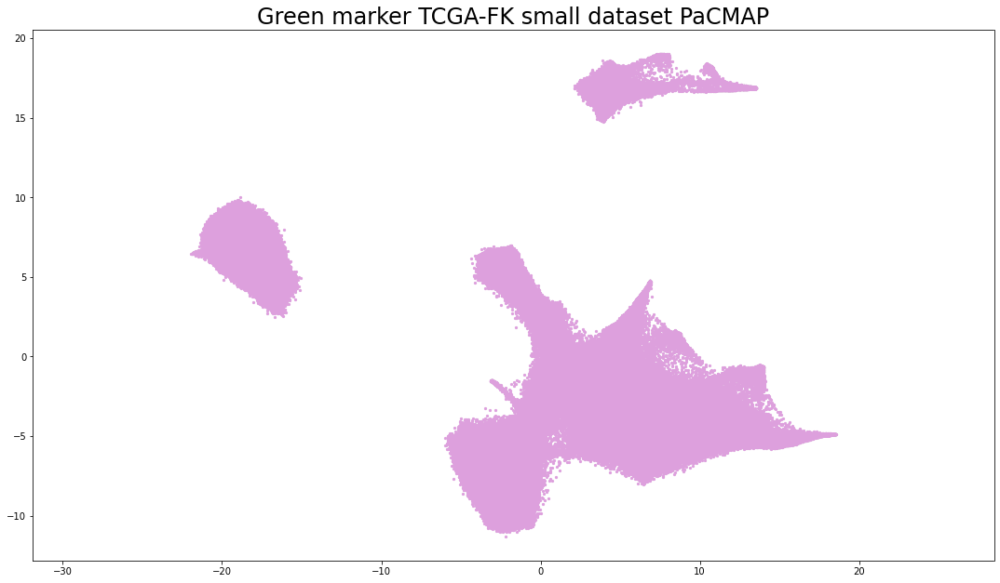

In [26]:
plt.figure(figsize =(18.5, 10.5)) 
plt.scatter(
    embed[:, 0],
    embed[:, 1], s=5, c='plum')
plt.gca().set_aspect('equal', 'datalim')
plt.title('Green marker TCGA-FK small dataset PaCMAP', fontsize=24)

In [ ]:
def getImage(path):
    return OffsetImage(plt.imread(path), zoom = 0.1)

x = embed[:, 0]
y = embed[:, 1]
fig, ax = plt.subplots()
fig.set_size_inches(17.5, 13.5)
ax.scatter(x, y) 
#fig = plt.figure(figsize =(7, 6)) 

for x0, y0, path in zip(x, y,paths):
    ab = AnnotationBbox(getImage(path), (x0, y0), frameon=False)
    ax.add_artist(ab)

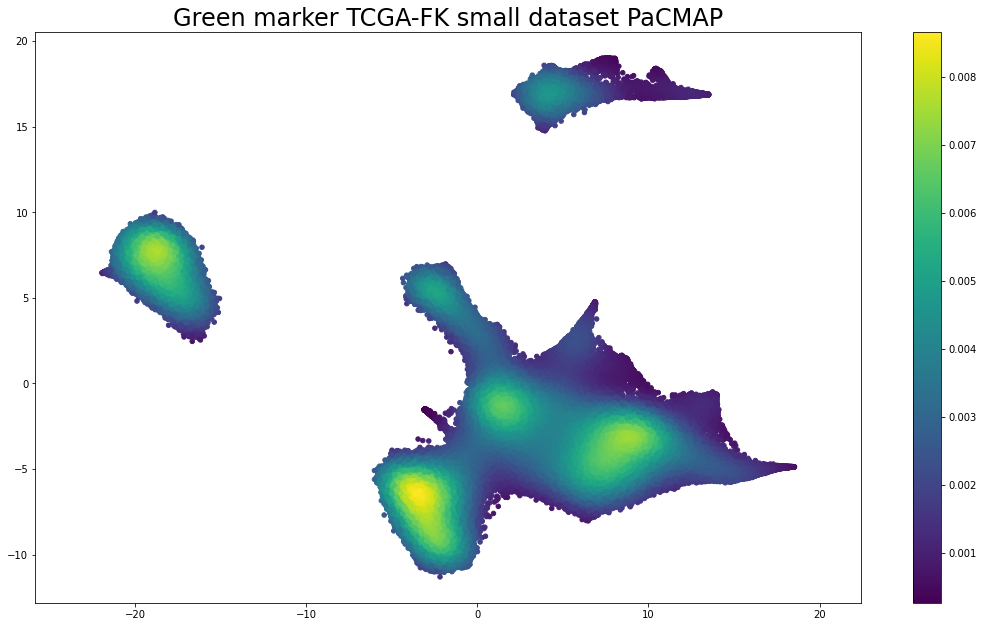

In [28]:
# Calculate the point density
xy = np.vstack([embed[:, 0],embed[:, 1]])
z = gaussian_kde(xy)(xy) #density 

fig, ax = plt.subplots()
fig.set_size_inches(18.5, 10.5)
sc = ax.scatter(embed[:, 0],embed[:, 1],c=z, s=20)
plt.colorbar(sc)
plt.gca().set_aspect('equal', 'datalim')
plt.title('Green marker TCGA-FK small dataset PaCMAP', fontsize=24)
plt.show()